# Pendahuluan

## Tujuan Bisnis Data Science

Penelitian-penelitian sebelumnya menunjukkan machine learning (pembelajaran mesin) sebagai salah satu alat yang efektif untuk memprediksi ketinggian gelombang. 
Mahjoobi & Adeli Mosabbeb (2009) meneliti algoritma Support Vector Machine (SVM) dalam memprediksi tinggi gelombang signifikan (H_s), dan membandingkannya dengan Artificial Neural Network (ANN). (Lou dkk., 2020) menyatakan ANN sebagai metode yang banyak digunakan dalam memprediksi parameter-parameter gelombang. Porlan-Ferrando dkk. (2025) meneliti akurasi support vector regressor (SVR), linear regression (LM), long short-term memory (LSTM), dan gated recurrent units (GRU) dalam memprediksi tinggi gelombang maksimum (H_max). Callens dkk., (2020) mengkaji algoritma random forest (RF) dan gradient boosting (GB) sebagai alternatif untuk ANN dalam meningkatkan peramalan kondisi laut dengan model numerik yang mempertimbangkan parameter tinggi gelombang signifikan, periode gelombang puncak, dan arah gelombang puncak. Penelitian tersebut mendapatkan hasil bahwa RF dan GB memberikan hasil yang lebih baik dibanding ANN, dengan GB lebih unggul daripada RF. Penelitian yang penulis lakukan bertujuan untuk mengkaji konsistensi kinerja algoritma RF dan GB dalam memprediksi ketinggian gelombang menggunakan objek data yang berbeda dari penelitian terdahulu. 


## Tujuan Teknis Data Science

Membuat model regresi menggunakan random forest dan gradient boosting untuk memprediksi ketinggian gelombang. Berdasarkan hasil pemodelan, akan dievaluasi kinerja tiap model regresi dan bandingkan antara dua model tersebut.

Kinerja model diukur menggunakan metrik berikut:
- MAE
- MSE dan RMSE
- R^2

# Libraries

In [1]:
# Dataframe manipulation
import pandas as pd
import numpy as np

# Missing value and outlier analysis
import missingno as msno
from scipy.stats import zscore

# Imputation and transformation
from scipy.interpolate import CubicSpline
from scipy.stats import boxcox
from scipy.special import inv_boxcox
import math
from scipy.stats import skew

# Visualization
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.inspection import permutation_importance
from skopt import BayesSearchCV
from sklearn.model_selection import cross_val_score
from skopt.space import Real, Integer
from scipy.stats import pearsonr

# Functions

## Data Index Splitter

Gunakan fungsi dibawah jika ingin membagi data menjadi beberapa bagian berdasarkan jumlah data tiap partisi.

In [2]:
def split_index_per_x(data, x=1000):
    """
    Fungsi untuk membagi index data per-x bagian.
    
    Args:
        - data (DataFrame): Dataframe input.
        - x (integer): Nilai konstan sebagai acuan untuk pembagian index data per-x baris. 
                       Default per-1000 data.
    Returns:
        - List of tuples: [(start1, end1), (start2, end2), ...]
    """

    n = len(data)
    ranges = []

    for i in range (0, n, x):
        start = i
        end = min(i + (x-1), n-1)
        ranges.append((start, end))
    
    return ranges

## Missing Value

### Missing Value Detector (Rows)

In [3]:
def data_with_missing_value(data, x=1):
    """
    Fungsi untuk mendeteksi data (baris) yang memiliki total x missing value (kolom).
    
    Args:
        - data (DataFrame): Dataframe input.
        - x (integer): jumlah kolom dengan missing value.
    Returns:
        - df_missing_value: Dataframe yang berisi baris 
          dengan total missing value sesuai nilai x.
        
    """
    df_missing_value = data[data.isnull().sum(axis=1) == x]
    print('Nama Dataframe baru: df_missing_value')
    print(f'Total baris dengan {x} missing value (kolom): {df_missing_value.shape[0]}')
    
    # Tampilkan sample
    if not df_missing_value.empty:
        display(df_missing_value.head())
   
    return df_missing_value

# Cara penggunaan: data_with_missing_value([dataframe's name], [an integer of total columns])

In [4]:
def data_with_missing_value_more_than(data, x=1):
    """
    Fungsi untuk mendeteksi data (baris) yang memiliki total >= x missing value (kolom).
    
    Args:
        - data (DataFrame): Dataframe input.
        - x (integer): jumlah kolom dengan missing value.
    Returns:
        - df_missing_value: Dataframe yang berisi baris 
          dengan total missing value >= nilai x.
        
    """
    df_missing_value_more_than = data[data.isnull().sum(axis=1) >= x]
    print('Nama Dataframe baru: df_missing_value_more_than')
    print(f'Total baris dengan {x} missing value (kolom): {df_missing_value_more_than.shape[0]}')
    
    # Tampilkan sample
    if not df_missing_value_more_than.empty:
        display(df_missing_value_more_than.head())
   
    return df_missing_value_more_than

# Cara penggunaan: data_with_missing_value_more_than([dataframe's name], [an integer of total columns])

### Missing Values Detector (Columns)

In [5]:
def missing_values_in_cols(data, column):
    """
    Fungsi untuk mendeteksi data (baris) dengan missing value di kolom tertentu.
    
    Args:
        - data (DataFrame): Dataframe input.
        - column (string): Nama kolom yang ingin dicek missing value.
    Returns:
        - df_missing_value_cols: Dataframe yang berisi baris 
          dengan missing value di kolom-kolom yang diberikan.
    """
    df_missing_value_cols = data[data[column].isnull()]
    print('Nama Dataframe baru: df_missing_value_cols')
    print(f'Total baris dengan missing value di kolom {column}: {df_missing_value_cols.shape[0]}')

    # Tampilkan sample
    if not df_missing_value_cols.empty:
        display(df_missing_value_cols)

    return df_missing_value_cols

# Cara penggunaan: missing_values_in_cols([dataframe's name], [name of a column from the dataframe)

### Handling Missing Value - Cyclic Data

Wind and Wave Direction

In [6]:
def impute_direction_simple(data, column_name):
    """
    Fungsi untuk mengimputasi missing values di kolom siklik (arah dalam derajat 1-360)
    menggunakan interpolasi spline langsung pada data derajat (tanpa transformasi sin-cos).

    Args: 
        - data (DataFrame): Dataframe input.
        - column_name (str): Nama kolom yang ingin diimputasi.

    Returns:
        - df_imputed (DataFrame): Dataframe baru yang telah diimputasi.
    """
    # Copy dataframe agar tidak merubah dataframe asli
    df_imputed = data.copy()
    
    y = df_imputed[column_name]
    
    # Buat interpolator dari data yang valid (tidak NaN)
    valid_idx = y[~y.isna()].index
    cs = CubicSpline(valid_idx, y.loc[valid_idx])

    # Imputasi data yang NaN
    nan_idx = y[y.isna()].index
    interpolated = cs(nan_idx)

    # Pastikan hasil berada dalam rentang 1-360
    interpolated_wrapped = (interpolated % 360)
    interpolated_wrapped[interpolated_wrapped ==0] = 360 # Ganti 0 dengan 360

    df_imputed.loc[nan_idx, column_name] = interpolated_wrapped
    
    return df_imputed

Wind and Wave Direction (+ transformasi ke sin dan cos)

In [7]:
def impute_direction(data, column_name):
    """
    Fungsi untuk mengimputasi missing values di kolom siklik (arah dalam derajat 1-360).
    
    Args: 
        - data (DataFrame): Dataframe input.
        - column_name (string): Nama kolom yang ingin diimputasi.
    Return:
        - df_imputed (DataFrame): Dataframe baru yang telah diimputasi.
    """
    # Copy dataframe agar tidak merubah dataframe asli
    df_imputed = data.copy()
    radians = np.deg2rad(df_imputed[column_name])

    # Konversi ke sin dan cos
    sin_col = np.sin(radians)
    cos_col = np.cos(radians)

     # Interpolasi cubic spline untuk sin
    valid_idx_sin = sin_col[~np.isnan(sin_col)].index
    cs_sin = CubicSpline(valid_idx_sin, sin_col[valid_idx_sin])
    sin_col[pd.isna(sin_col)] = cs_sin(sin_col[pd.isna(sin_col)].index)

    # Interpolasi cubic spline untuk cos
    valid_idx_cos = cos_col[~np.isnan(cos_col)].index
    cs_cos = CubicSpline(valid_idx_cos, cos_col[valid_idx_cos])
    cos_col[pd.isna(cos_col)] = cs_cos(cos_col[pd.isna(cos_col)].index)

    # Gabungkan kembali ke arah dalam derajat
    angle_rad = np.arctan2(sin_col, cos_col)
    angle_deg = (np.rad2deg(angle_rad) + 360) % 360

    df_imputed[column_name] = angle_deg
    return df_imputed


## Outliers

### IQR Based Outlier Detector

Total Outlier tanpa partisi.

In [8]:
def count_outliers_iqr(data, columns=[]):
    """
    Fungsi untuk deteksi dan hitung outlier menggunakan metode IQR (Interquartile Range) untuk setiap kolom.

    Args:
        - data (DataFrame): Dataframe input.
        - columns (list): Daftar nama kolom.

    Returns:
        - df_outlier_counts (DataFrame): Jumlah outlier untuk setiap kolom.
        - df_outlier_mask (DataFrame): DataFrame boolean mask (True = outlier).
    """
    outlier_counts = {}
    outlier_mask_df = pd.DataFrame(index=data.index)

    for col in columns:
        series = data[col].dropna()
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        # Mask untuk semua data (termasuk NaN tetap NaN)
        outlier_mask = (data[col] < lower) | (data[col] > upper)
        outlier_mask_df[col] = outlier_mask

        # Hitung jumlah outlier valid (exclude NaN)
        total_outlier = outlier_mask.sum()
        outlier_counts[col] = total_outlier

    df_outlier_counts = pd.DataFrame(list(outlier_counts.items()), columns=['Column', 'Outlier_Count'])
    return df_outlier_counts, outlier_mask_df


Total outlier dengan partisi.

In [9]:
def count_outliers_iqr_parted(data, x=1000, columns=[]):
    """
    Fungsi untuk deteksi outlier menggunakan metode IQR (Interquartile Range), dihitung dalam potongan per-x baris.

    Args:
        - data (DataFrame): Dataframe input.
        - x (int): Jumlah baris per range (misal: 1000).
        - columns (list): List nama kolom yang akan dicek.

    Returns:
        - df_outliers_iqr_parted (DataFrame): Jumlah outlier per kolom.
        - outlier_mask_df (DataFrame): DataFrame boolean mask (True = outlier).
    """
    ranges = split_index_per_x(data, x)
    outlier_summary = []
    outlier_mask_df = pd.DataFrame(False, index=data.index, columns=columns)  # Inisialisasi kosong (False)

    for col in columns:
        outliers_count = 0

        for start, end in ranges:
            values = data[col].loc[start:end]
            clean_values = values.dropna()

            if clean_values.empty:
                print(f'⚠️ Kolom {col} (index {start}-{end}): Tidak ada data.')
                continue

            Q1 = clean_values.quantile(0.25)
            Q3 = clean_values.quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            mask = (values < lower_bound) | (values > upper_bound)
            outliers_count += mask.sum()

            # Simpan mask ke DataFrame utama
            outlier_mask_df.loc[start:end, col] |= mask  # Gunakan |= agar jika ada outlier di potongan lain tetap True

        outlier_summary.append({
            'Column': col,
            'Outlier_Count': outliers_count
        })

    df_outliers_iqr_parted = pd.DataFrame(outlier_summary)

    return df_outliers_iqr_parted, outlier_mask_df


Statistic Summary

In [10]:
def get_iqr_summary(data, columns=None):
    """
    Fungsi untuk melihat nilai-nilai statistik yang berkaitan dengan Interquartile Range.
    
    Args:
        - data (DataFrame): Dataframe input.
        - columns (list): List nama kolom yang ingin diperiksa.
    Returns:
        - summary (DataFrame): Dataframe berisi nilai-nilai statistik.
    """
    if columns is None:
        columns = data.columns # Jika tidak ditentukan, gunakan semua kolom
    
    # Inisiasi list untuk summary
    summary = []

    for col in columns:
        if pd.api.types.is_numeric_dtype(data[col]):   # Hanya ambil kolom numerik
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            min_val = data[col].min()
            max_val = data[col].max()

            summary.append({
                'Kolom': col,
                'Min': min_val,
                'Q1': Q1,
                'Q3': Q3,
                'IQR': IQR,
                'max_val': max_val,
                'Lower Bound': Q1 - 1.5 * IQR,
                'Upper Bound': Q3 + 1.5 * IQR
            })

    return pd.DataFrame(summary)

Rows with Outlier(s)

In [11]:
def rows_with_outliers(data, columns=[]):
    """
    Fungsi untuk mengambil data (baris) yang memiliki outlier di kolom-kolom tertentu.
    
    Args:
        - data (DataFramme): Dataframe input.
        - columns (list): List nama kolom yang ingin diperiksa.
    Returns:
        - outliers_df (DataFrame): Dataframe berisi data (baris) dengan outlier di kolom tertentu.
    """
    # Copy dataframe
    result = data.copy()

    for col in columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Tambahkan kolom penanda untuk menandai outlier
        result[f'outlier_{col}'] = (data[col] < lower_bound) | (data[col] > upper_bound)
    
    # Ambil hanya baris dengan outlier di semua kolom yang ada di list
    strict_cond = result[[f'outlier_{col}' for kol in columns]].all(axis=1)
    
    return result[strict_cond]

### Median Absolute Deviation Based Outlier Detector

Tanpa partisi.

In [12]:
def count_outliers_mad(data, columns=None, threshold=3.0):
    """
    Deteksi dan hitung outlier menggunakan metode MAD (Median Absolute Deviation).

    Args:
        data (pd.DataFrame): DataFrame input.
        columns (list or None): Daftar nama kolom numerik yang akan diperiksa.
                                Jika None, semua kolom numerik akan digunakan.
        threshold (float): Batas z-score berbasis MAD untuk menentukan outlier (default: 3.0).

    Returns:
        df_outlier_counts (pd.DataFrame): DataFrame berisi jumlah outlier untuk setiap kolom.
        df_outlier_mask (pd.DataFrame): DataFrame boolean mask (True = outlier).
    """
    if columns is None:
        columns = data.select_dtypes(include=np.number).columns.tolist()

    outlier_counts = {}
    outlier_mask_df = pd.DataFrame(index=data.index)

    for col in columns:
        if col not in data.columns:
            print(f"⚠️ Kolom '{col}' tidak ditemukan di DataFrame, dilewati.")
            continue

        series = data[col].copy().dropna()

        b = 1.4826  # Konstanta MAD agar sebanding dengan standar deviasi
        median = series.median()
        mad = b * np.median(np.abs(series - median))

        if mad == 0:
            print(f"⚠️ Kolom '{col}': MAD = 0, dilewati.")
            outlier_mask = pd.Series(False, index=data.index)
        else:
            outlier_mask = np.abs((series - median) / mad) > threshold

        outlier_mask_df[col] = outlier_mask
        outlier_counts[col] = outlier_mask.sum()

    df_outlier_counts = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=['Outlier_Count'])
    df_outlier_counts.index.name = 'Column'
    df_outlier_counts = df_outlier_counts.reset_index()

    return df_outlier_counts, outlier_mask_df

Dengan partisi.

In [13]:
def count_outliers_mad_parted(data, x=500, columns=[], threshold=3):
    """
    Fungsi untuk deteksi outlier menggunakan metode MAD (Median Absolute Deviation)
    untuk tiap range (x baris), lalu menghitung total outlier per kolom
    dan mengembalikan mask DataFrame boolean.

    Returns:
        - df_outliers (DataFrame): Jumlah outlier per kolom.
        - outlier_mask_df (DataFrame): DataFrame boolean [True = outlier].
    """
    ranges = split_index_per_x(data, x)
    outlier_summary = []
    outlier_mask_df = pd.DataFrame(False, index=data.index, columns=columns)  # Inisialisasi dengan False

    for col in columns:
        total_outliers = 0

        for start, end in ranges:
            #values = data[col].loc[start:end].dropna()
            values = data[col].iloc[start:end+1].dropna()


            if values.empty:
                continue

            b = 1.4826
            median = values.median()
            mad = b * np.median(np.abs(values - median))

            if mad == 0:
                continue

            outlier_mask = np.abs((values - median) / mad) > threshold
            total_outliers += outlier_mask.sum()

            # Tandai True di posisi outlier
            outlier_mask_df.loc[outlier_mask.index, col] |= outlier_mask

        outlier_summary.append({'Column': col, 'Outlier_Count': total_outliers})

    df_outliers_mad_parted = pd.DataFrame(outlier_summary)

    return df_outliers_mad_parted, outlier_mask_df


### Outlier Visualization

Tanpa partisi.

In [14]:
def visualize_outliers(data, columns=[], method='iqr', threshold=3):
    """
    Fungsi untuk memvisualisasi data dengan outlier sesuai metode identifikasi yang dipilih.
    Visualisasi dalam bentuk stem plot.

    Args:
        - data (DataFrame): DataFrame input.
        - columns (list): Daftar nama kolom untuk dicek dan divisualisasikan.
        - method (str): Metode yang digunakan. ['iqr', 'mad']
        - threshold (float): Threshold standar deviasi (khusus MAD).

    Returns:
        - Visualisasi stem plot.
    """

    if not columns:
        columns = data.select_dtypes(include='number').columns.tolist()
        print("🔍 Tidak ada kolom diberikan. Menggunakan semua kolom numerik.")

    for col in columns:
        series = data[col].copy().dropna()

        if method == 'iqr':
            Q1 = series.quantile(0.25)
            Q3 = series.quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR
            outlier_mask = (series < lower) | (series > upper)

        if method == 'mad':
            b = 1.4826
            median = series.median()
            mad = b * np.median(np.abs(series - median))
            if mad == 0:
                print(f'⚠️ Kolom {col}: MAD = 0, dilewati.\n')
            else:
                outlier_mask = np.abs((series - median) / mad) > threshold

        if method not in ['iqr', 'mad']:
            print(f"⚠️ Metode '{method}' tidak dikenali. Gunakan 'iqr' atau 'mad'.")
            continue

        normal_mask = ~outlier_mask  # kebalikan dari outlier

        # Visualisasi
        plt.figure(figsize=(10, 3))
        #plt.stem(series.index, series.values, linefmt='grey', markerfmt=' ', basefmt=' ')
        plt.scatter(series.index[outlier_mask], series[outlier_mask], c='red', s=10, label='Outlier', zorder=2)
        plt.scatter(series.index[normal_mask], series[normal_mask], c='green', s=10, label='Normal', zorder=1)
        plt.title(f'Stem Plot with Outliers - {col.upper()} ({method.upper()})')
        plt.xlabel('Index')
        plt.ylabel(col)
        plt.grid(True)
        plt.legend()
        plt.show()
        print(f'total outlier {col}: {outlier_mask.sum()}')

Dengan partisi.

In [15]:
def visualize_outliers_parted_combined(data, columns=[], method='mad', x=500, threshold=3):
    """
    Visualisasi outlier per partisi menggunakan metode IQR atau MAD,
    tapi seluruh hasil visualisasi ditampilkan dalam satu grafik per kolom.

    Args:
        - data (DataFrame): Data input.
        - columns (list): Daftar kolom untuk dicek.
        - method (str): Metode deteksi outlier ('iqr' atau 'mad').
        - x (int): Jumlah baris per partisi.
        - threshold (float): Ambang batas MAD (hanya digunakan jika method='mad').
    """
    ranges = [(i, min(i + x - 1, len(data) - 1)) for i in range(0, len(data), x)]

    for col in columns:
        is_outlier_global = pd.Series(False, index=data.index)

        for start, end in ranges:
            #chunk = data[col].loc[start:end].dropna()
            chunk = data[col].iloc[start:end+1].dropna()


            if chunk.empty:
                continue

            if method == 'iqr':
                Q1 = chunk.quantile(0.25)
                Q3 = chunk.quantile(0.75)
                IQR = Q3 - Q1
                lower_bound = Q1 - 1.5 * IQR
                upper_bound = Q3 + 1.5 * IQR
                outliers = (chunk < lower_bound) | (chunk > upper_bound)

            elif method == 'mad':
                b = 1.4826
                median = chunk.median()
                mad = b * np.median(np.abs(chunk - median))
                if mad == 0:
                    continue
                outliers = np.abs((chunk - median) / mad) > threshold

            else:
                print(f"⚠️ Metode '{method}' tidak dikenali. Gunakan 'iqr' atau 'mad'.")
                return

            #is_outlier_global.loc[start:end] = is_outlier_global.loc[start:end] | outliers
            is_outlier_global.iloc[start:end+1] = is_outlier_global.iloc[start:end+1] | outliers


        is_not_outlier_global = ~is_outlier_global
        
        # Visualisasi
        plt.figure(figsize=(12, 4))
        #plt.stem(data.index, data[col], linefmt='lightgrey', markerfmt=' ', basefmt=' ')
        plt.scatter(data.index[is_outlier_global], data[col][is_outlier_global], c='red', s=10, label='Outlier', zorder=2)
        plt.scatter(data.index[is_not_outlier_global], data[col][is_not_outlier_global], c='green', s=10, label='Normal', zorder=1)
        plt.title(f'Stem Plot with Outliers ({method.upper()} Parted) - {col}')
        plt.xlabel('Index')
        plt.ylabel(col)
        plt.legend()
        plt.grid(True)

        # Tampilkan label x-axis setiap 2000 data
        xtick_locs = data.index[::2000]
        plt.xticks(xtick_locs, rotation=45)

        plt.tight_layout()
        plt.show()

### Handling Outlier

#### Imputing Outliers with NaN

Tanpa partisi.

In [16]:
def outliers_to_NaN(data, columns=[], method='iqr', threshold=3):
    """
    Fungsi untuk mendeteksi dan mengganti outlier dengan NaN menggunakan IQR atau MAD.
    
    Args:
        - data (DataFrame): DataFrame input.
        - columns (list): List nama kolom numerik yang akan diperiksa.
        - method (str): 'iqr' atau 'mad'.
        - threshold (float): Threshold MAD z-score atau IQR factor.
    
    Returns:
        - DataFrame baru dengan outlier diganti NaN.
    """
    df_clean = data.copy()
    b = 1.4826  # konstanta MAD

    for col in columns:
        series = pd.to_numeric(df_clean[col], errors='coerce')

        if method == 'iqr':
            Q1 = series.quantile(0.25)
            Q3 = series.quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR
            outlier_mask = (series < lower) | (series > upper)
            df_clean.loc[outlier_mask, col] = np.nan

        elif method == 'mad':
            # dropna only from this column for median and mad computation
            clean_series = series.dropna()
            median = clean_series.median()
            mad = b * np.median(np.abs(clean_series - median))
            if mad == 0:
                print(f'⚠️ Kolom {col}: MAD = 0, dilewati.')
                continue
            z_score = np.abs((series - median) / mad)
            outlier_mask = z_score > threshold
            df_clean.loc[outlier_mask, col] = np.nan

        else:
            print(f"⚠️ Metode '{method}' tidak dikenali. Gunakan 'iqr' atau 'mad'.")
            return None

    print(f"✅ Outlier diganti NaN dengan metode '{method}'.")
    return df_clean


Dengan partisi.

In [17]:
def outliers_to_NaN(data, columns=[], method='mad', threshold=3, partition_size=500):
    """
    Fungsi untuk mendeteksi dan mengganti outlier dengan NaN menggunakan IQR atau MAD.
    Proses dilakukan pada setiap partisi data sesuai ukuran yang ditentukan.

    Args:
        - data (DataFrame): DataFrame input.
        - columns (list): List nama kolom numerik yang akan diperiksa.
        - method (str): 'iqr' atau 'mad'.
        - threshold (float): Threshold MAD atau IQR factor.
        - partition_size (int): Ukuran partisi data.

    Returns:
        - DataFrame baru dengan outlier diganti NaN.
    """
    df_clean = data.copy()
    partitions = split_index_per_x(df_clean, partition_size)

    for part in partitions:
        for col in columns:
            series = pd.to_numeric(part[col], errors='coerce')

            if method == 'iqr':
                Q1 = series.quantile(0.25)
                Q3 = series.quantile(0.75)
                IQR = Q3 - Q1
                lower = Q1 - 1.5 * IQR
                upper = Q3 + 1.5 * IQR
                outlier_mask = (series < lower) | (series > upper)
                part.loc[outlier_mask, col] = np.nan

            elif method == 'mad':
                clean_series = series.dropna()
                median = clean_series.median()
                b = 1.4826  # konstanta MAD
                mad = b * np.median(np.abs(clean_series - median))
                if mad == 0:
                    print(f'⚠️ Kolom {col}: MAD = 0, dilewati.')
                    continue
                z_score = np.abs((series - median) / mad)
                outlier_mask = z_score > threshold
                part.loc[outlier_mask, col] = np.nan

            else:
                print(f"⚠️ Metode '{method}' tidak dikenali. Gunakan 'iqr' atau 'mad'.")
                return None

    print(f"✅ Outlier diganti NaN dengan metode '{method}' pada tiap partisi.")
    return pd.concat(partitions).sort_index()

#### Capping

IQR

In [18]:
def cap_outliers_IQR(data, column):
    """
    Fungsi untuk mengidentifikasi outlier (metode MAD) lalu melakukan capping,
    dalam kasus ini mengganti nilai outliers dengan lower bound dan upper bound
    
    !!! fungsi hanya berlaku di satu kolom. 
    !!! Aplikasikan lagi fungsi jika ingin digunakan untuk beberapa kolom.
    
    Args:
        - data (DataFrame): Dataframe input.
        - column (str): Nama kolom yang akan diproses.
    Returns:
        - DataFrame baru dengan outlier yang sudah dicapping.
    """
    # Copy dataframe agar tidak merubah dataframe asli
    data = data.copy()

    # Hitung kuartil dan IQR
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Capping nilai di luar batas
    data[column] = np.where(data[column] < lower_bound, lower_bound,
                       np.where(data[column] > upper_bound, upper_bound, data[column]))
    df_capped = data.copy()
    
    return df_capped

MAD

In [19]:
def cap_outliers_MAD(data, column):
    """
    Fungsi untuk mengidentifikasi outlier (dengan metode MAD) lalu melakukan capping,
    yaitu mengganti nilai outliers dengan lower bound dan upper bound.

    !!! Fungsi hanya berlaku untuk satu kolom.
    !!! Jika ingin untuk beberapa kolom, aplikasikan fungsi ini berulang.
    
    Args:
        - data (DataFrame): Dataframe input.
        - column (str): Nama kolom yang akan diproses.
    Returns:
        - DataFrame baru dengan outlier yang sudah dicapping.
    """
    # Copy dataframe agar tidak mengubah aslinya
    data = data.copy()

    values = data[column]
    b = 1.4826  # Scaling factor untuk MAD
    median = values.median()
    mad = b * np.median(np.abs(values - median))

    if mad == 0:
        print(f"⚠️ MAD = 0 untuk kolom {column}. Tidak dilakukan capping.")
        return data

    threshold = 3  # Threshold umum MAD
    lower_bound = median - threshold * mad
    upper_bound = median + threshold * mad

    # Lakukan capping
    data[column] = np.where(data[column] < lower_bound, lower_bound,
                      np.where(data[column] > upper_bound, upper_bound, data[column]))
    df_capped = data.copy()
    
    return df_capped

## Visualization

#### Stem Plot

In [20]:
def data_stem_plot(data, x_col, y_col):
    """
    Fungsi untuk visualisasi stem plot.

    Args:
        - data (DataFrame): Dataframe input.
        - x_col (str): Nama kolom untuk sumbu x.
        - y_col (str): Nama kolom untuk sumbu y.

    Returns:
        Visualisasi stem plot.
    """

    if x_col not in data.columns or y_col not in data.columns:
        print(f"⚠️ Kolom '{x_col}' atau '{y_col}' tidak ditemukan dalam DataFrame.")
        return

    x = data[x_col]
    y = data[y_col]

    plt.figure(figsize=(10, 4))
    plt.stem(x, y, linefmt='grey', markerfmt='ro', basefmt=" ", use_line_collection=True)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f'Stem Plot: {y_col} vs {x_col}')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

#### Scatter Plot

In [21]:
def data_scatter_plot(data, x_col, y_col):
    """
    Fungsi untuk visualisasi data dalam bentuk scatter plot.

    Args:
        - data (DataFrame): Dataframe input.
        - x_col (str): Nama kolom sumbu x.
        - y_col (str): Nama kolom sumbu y.

    Returns:
        - Visualisasi scatter plot.
    """

    if x_col not in data.columns or y_col not in data.columns:
        print(f"⚠️ Kolom '{x_col}' atau '{y_col}' tidak ditemukan dalam DataFrame.")
        return

    plt.figure(figsize=(8, 5))
    plt.scatter(data[x_col], data[y_col], c='steelblue', edgecolors='black', s=30, alpha=0.7)
    plt.title(f'Scatter Plot: {y_col} vs {x_col}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

#### Histogram - Distributions

Dataframe

In [22]:
def data_histogram(data):
    """
    Fungsi untuk memvisualisasikan distribusi data numerik dalam bentuk histogram.
    
    Args:
        - data (DataFrame): Dataframe input.
    """
    # Ambil hanya kolom numerik
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    n_cols = len(numeric_cols)

    if n_cols == 0:
        print('⚠️ Tidak ada kolom numerik untuk divisualisasikan.')
        return
    
    # Hitung jumlah baris dan kolom subplot
    n_rows = math.ceil(n_cols / 4)  # 3 kolom per baris (bisa diubah sesuai kebutuhan)
    
    fig, axes = plt.subplots(n_rows, 4, figsize=(15, 4 * n_rows))
    axes = axes.flatten()  # Flatten supaya mudah diiterasi

    for i, col in enumerate(numeric_cols):
        sns.histplot(data=data, x=col, kde=True, color="skyblue", ax=axes[i])
        axes[i].grid(True)
    
    # Sembunyikan plot kosong jika axis lebih
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    fig.suptitle('Data Distributions', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

Series

In [23]:
def series_histogram(series):
    import matplotlib.pyplot as plt
    plt.hist(series, bins=40, edgecolor='black')
    plt.title("Histogram")
    plt.xlabel(series.name if series.name else "Value")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

#### Boxplot - Statistics (IQR Based Outlier Detection)

In [24]:
def data_boxplot(data):
    """
    Fungsi untuk memvisualisasikan distribusi data numerik dalam bentuk boxplot.
    
    Args:
        - data (DataFrame): Dataframe input.
    """
    # Ambil hanya kolom numerik
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    n_cols = len(numeric_cols)

    if n_cols == 0:
        print('⚠️ Tidak ada kolom numerik untuk divisualisasikan.')
        return

    # Hitung jumlah baris dan kolom subplot
    n_rows = math.ceil(n_cols / 4)  # 3 kolom per baris (bisa diubah sesuai kebutuhan)
    
    fig, axes = plt.subplots(n_rows, 4, figsize=(15, 4 * n_rows))
    axes = axes.flatten()  # Flatten supaya mudah diiterasi

    for i, col in enumerate(numeric_cols):
        sns.boxplot(x=data[col], color="skyblue", ax=axes[i])
        axes[i].grid(True)
    
    # Sembunyikan plot kosong jika axis lebih
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    fig.suptitle('Boxplot (IQR Based)', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

#### Monthly Trend Time Series Visualization

In [25]:
def plot_monthly_trend(df, y_col, x_col="MM", hue_col="#YY"):
    """
    Fungsi untuk memplot tren bulanan untuk kolom numerik tertentu dengan garis per tahun.

    Args:
        df (DataFrame): Dataframe input.
        y_col (str): Nama kolom yang akan diplot di sumbu Y.
        x_col (str): Nama kolom untuk sumbu X (default: 'MM' - bulan).
        hue_col (str): Nama kolom untuk grup warna berdasarkan kategori (default: '#YY' - tahun).
    """
    plt.figure(figsize=(7, 5))
    sns.lineplot(data=df, x=x_col, y=y_col, hue=hue_col)

    plt.title(f"Monthly {y_col} Trend")
    plt.xlabel("Month")
    plt.ylabel(y_col)
    plt.legend(title="Year")
    plt.xticks(range(1, 13))
    plt.grid(True)
    plt.show()


#### Graph

In [26]:
def plot_multiple_variables(data, columns, title="Variables' Plot", ylabel='Value'):
    """
    Fungsi untuk memvisualisasi beberapa kolom dalam satu figure. 
    
    Args:
        - data (DataFrame): Dataframe input.
        - columns (list): List kolom input.
        - title (string): Judul figure.
        - ylabel (string): Label sumbu y.
    """
    plt.figure(figsize=(9,5))

    for col in columns:
        plt.plot(data.index, data[col], label=col)

    plt.title(title)
    plt.xlabel('Index')
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

## Transformation

### Skewness Score

In [27]:
def hitung_skewness_fisher(data):
    """
    Menghitung skewness (Fisher–Pearson standardized moment coefficient) secara manual.
    
    Parameter:
        data (list): List atau array nilai numerik.

    Return:
        float: Nilai skewness G₁.
    """
    n = len(data)
    if n < 3:
        raise ValueError("Jumlah data minimal 3 untuk menghitung skewness dengan rumus ini.")

    # Hitung rata-rata
    mean = sum(data) / n

    # Hitung standar deviasi (s)
    variance = sum((x - mean) ** 2 for x in data) / (n - 1)
    std_dev = variance ** 0.5

    # Hitung momen ke-3 (dengan pembagian std_dev)
    m3 = sum(((x - mean) / std_dev) ** 3 for x in data)

    # Hitung G1
    G1 = (n / ((n - 1) * (n - 2))) * m3

    return G1

In [28]:
def var_skewness(dataframe, col_list):
    """
    Menghitung nilai skewness dari kolom-kolom numerik dalam DataFrame.
    
    Parameters:
        dataframe (pd.DataFrame): DataFrame input.
        kolom_list (list): Daftar nama kolom yang akan dihitung skewness-nya.

    Returns:
        pd.DataFrame: DataFrame berisi nama kolom dan nilai skewness.
    """
    result = []

    for col in col_list:
        if pd.api.types.is_numeric_dtype(dataframe[col]):
            nilai_skew = skew(dataframe[col].dropna())
            result.append({'Kolom': col, 'Skewness': nilai_skew})
        else:
            print(f"Kolom '{col}' bukan numerik, dilewati.")

    return pd.DataFrame(result)


### Visualisasi Distribusi dan Skewness data

In [29]:
def data_skew(data, columns):
    n = len(columns)
    nrows = (n//3) + (n%3>0)

    fig, axs = plt.subplots(nrows=nrows, ncols=3, figsize=(8, 2.5*nrows))
    axs = axs.flatten()

    for i, col in enumerate(columns):
        sns.histplot(data=data, x=col, kde=True, color="skyblue", ax=axs[i])
        skewness = data[col].skew()
        axs[i].set_title(f'Skewness: {skewness:.2f}')

    # Sembunyikan subplot kosong jika jumlah kolom < nrows * 3
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])
        
    plt.tight_layout()
    plt.show()

In [30]:
# Fungsi untuk menampilkan distribusi dan skewness sebelum dan sesudah transformasi
def compare_transformations(data, column):
    data = data[column]
    # Buat transformasi
    transforms = {
        'Original': data,
        'Log': np.log1p(data),            # log(1 + x) agar aman untuk nol
        'Sqrt': np.sqrt(data),
    }

    # Box-Cox hanya bisa untuk x > 0 -- seluruh nilai di dataset > 0
    if (data > 0).all():
        transforms['Box-Cox'], _ = boxcox(data)

    n = len(transforms)
    fig, axs = plt.subplots(1, n, figsize=(5*n, 4))

    for i, (name, transformed) in enumerate(transforms.items()):
        sns.histplot(transformed, kde=True, ax=axs[i], color='skyblue')
        skew_val = pd.Series(transformed).skew()
        axs[i].set_title(f'{name}\nSkewness: {skew_val:.2f}')
    
    plt.tight_layout()
    plt.show()

# Fungsi untuk beberapa kolom sekaligus
def batch_compare_transformations(df, columns):
    for col in columns:
        print(f'\n📊 Column: {col}')
        compare_transformations(df, col)

### Box-cox

In [31]:
def transform_data_boxcox(data, columns):
    """
    Fungsi untuk mentransformasi beberapa kolom di satu dataframe dengan metode Box-cox.
    
    Args:
        - data (DataFrame): Dataframe input.
        - columns (list): List nama kolom yang akan ditransformasi.
    Returns:
        - df_transformed (DataFrame): Dataframe baru yang sudah ditransformasi.
        - lambdas (dict): Dictionary kolom dan nilai lambda-nya untuk inverse transform.
    """
    # Copy dataframe agar data asli tidak berubah
    df_transformed = data.copy() 

    lambdas = {}

    for col in columns:
        data = df_transformed[col]

        # Box-Cox hanya bisa untuk x > 0 -- seluruh nilai di dataset > 0
        if (data > 0).all():
            transformed, lam = boxcox(data)
            df_transformed[col]= transformed
            
            lambdas[col] = lam
            
            print(f'✅ Kolom "{col}" ditransformasi dengan Box-Cox. Skewness baru: {pd.Series(transformed).skew():.2f}')
        else:
            print(f'⚠️ Kolom "{col}" mengandung nilai ≤ 0. Tidak bisa pakai Box-Cox.')

    return df_transformed, lambdas

In [32]:
def inverse_boxcox(df_transformed, lambdas):
    """
    Mengembalikan data yang ditransformasi Box-Cox ke bentuk aslinya.
    
    Args:
        - df_transformed (DataFrame): Data yang sudah ditransformasi.
        - lambdas (dict): Dictionary kolom dan nilai lambda-nya.
    
    Returns:
        - df_original (DataFrame): Data setelah inverse transform.
    """
    df_original = df_transformed.copy()

    for col, lam in lambdas.items():
        df_original[col] = inv_boxcox(df_transformed[col], lam)

    return df_original

Contoh pemakaian transformasi dan invers boxcox.

- Transformasi boxcox

df_bc, lambdas = transform_data_boxcox(df, ['wspd', 'rain'])

- Balik ke bentuk asli

df_original = inverse_boxcox(df_bc, lambdas)


### Log

In [33]:
def log_transform_data(df, columns):
    """
    Fungsi untuk mentransformasi beberapa kolom di satu dataframe dengan metode Log Transform.
    
    Args:
        - df (DataFrame): Dataframe input.
        - columns (list): List nama kolom yang akan ditransformasi.
        
    Returns:
        - df_transformed (DataFrame): Dataframe baru yang sudah ditransformasi.
    """
    df_transformed = df.copy()
    
    for col in columns:
        data = df_transformed[col]

        # Log hanya bisa untuk x > 0
        if (data > 0).all():
            transformed = np.log(data)
            df_transformed[col] = transformed

            print(f'✅ Kolom "{col}" ditransformasi dengan Log. Skewness baru: {pd.Series(transformed).skew():.2f}')
        else:
            print(f'⚠️ Kolom "{col}" mengandung nilai ≤ 0. Tidak bisa pakai Log Transform.')

    return df_transformed


### Square root

In [34]:
def sqrt_transform_data(df, columns):
    """
    Fungsi untuk mentransformasi beberapa kolom di satu dataframe dengan metode Square Root Transform.
    
    Args:
        - df (DataFrame): Dataframe input.
        - columns (list): List nama kolom yang akan ditransformasi.
        
    Returns:
        - df_transformed (DataFrame): Dataframe baru yang sudah ditransformasi.
    """
    df_transformed = df.copy()
    
    for col in columns:
        data = df_transformed[col]

        # Square root hanya untuk x >= 0
        if (data >= 0).all():
            transformed = np.sqrt(data)
            df_transformed[col] = transformed

            print(f'✅ Kolom "{col}" ditransformasi dengan Square Root. Skewness baru: {pd.Series(transformed).skew():.2f}')
        else:
            print(f'⚠️ Kolom "{col}" mengandung nilai negatif. Tidak bisa pakai Square Root Transform.')

    return df_transformed

## Model Evaluation

In [139]:
def evaluate_model(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    bias = np.mean(y_pred - y_true)
    corr, _ = pearsonr(y_true, y_pred)  # Pearson correlation

    print(f"\n📊 Evaluasi Model: {model_name}")
    print(f"MAE   : {mae:.5f}")
    print(f"RMSE  : {rmse:.5f}")
    print(f"R²    : {r2:.5f}")
    print(f"Bias  : {bias:.5f}")
    print(f"Pearson Correlation (r): {corr:.5f}")

    return {
        'Model': model_name,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'Bias': bias,
        'Pearson_r': corr
    }

# Load Dataset

In [36]:
df = pd.read_csv("data_final.csv")
df


,#YY,MM,DD,hh,mm,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,PRES,ATMP,WTMP,DEWP,VIS,TIDE
0,2020,1,1,0,40,54,9.8,12.2,3.53,10.00,7.40,81,1016.4,24.8,25.7,19.1,99.0,99.0
1,2020,1,1,1,40,57,10.0,13.1,3.60,10.00,7.34,84,1016.4,24.8,25.7,18.9,99.0,99.0
2,2020,1,1,2,40,58,8.3,10.8,3.92,10.81,7.58,84,1016.9,24.1,25.7,18.1,99.0,99.0
3,2020,1,1,3,40,48,8.9,11.7,3.78,10.00,7.81,77,1017.4,24.4,25.7,20.0,99.0,99.0
4,2020,1,1,4,40,57,9.8,13.5,3.44,10.81,7.23,83,1017.8,24.5,25.7,19.2,99.0,99.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43597,2024,12,31,19,40,65,9.7,11.9,2.13,10.00,5.80,12,9999.0,24.6,25.1,20.6,99.0,99.0
43598,2024,12,31,20,40,68,9.0,11.3,2.16,11.43,5.81,6,9999.0,24.6,25.1,20.9,99.0,99.0
43599,2024,12,31,21,40,61,8.9,10.7,2.15,12.12,6.04,350,9999.0,24.8,25.1,21.1,99.0,99.0
43600,2024,12,31,22,40,69,7.6,9.7,2.29,11.43,6.06,350,9999.0,24.5,25.1,21.3,99.0,99.0


# Exploratory Data Analysis

In [37]:
# columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']

### Data Description

![image.png](attachment:image.png)

![image.png](attachment:image.png)

Data yang digunakan adalah meteorogical data yang berasal dari website National Data Buoy Center - National Oceanic and Atmospheric Administration. Data ini memuat 18 variabel termasuk waktu pengambilan tiap 40 menit dengan variabel-variabel berikut:
- ##YY: year, MM: month, DD: Day, hh: hour, mm: minute 
- WDIR: Wind direction (the direction the wind is coming from in degrees clockwise from true N) during the same period used for WSPD. See Wind Averaging Methods
- WSPD: Wind speed (m/s) averaged over an eight-minute period for buoys and a two-minute period for land stations. Reported Hourly. See Wind Averaging Methods.
- GST: Peak 5 or 8 second gust speed (m/s) measured during the eight-minute or two-minute period. The 5 or 8 second period can be determined by payload, See the Sensor Reporting, Sampling, and Accuracy section.
- WVHT: Significant wave height (meters) is calculated as the average of the highest one-third of all of the wave heights during the 20-minute sampling period. See the Wave Measurements section.
- DPD: Dominant wave period (seconds) is the period with the maximum wave energy. See the Wave Measurements section.
- APD: Average wave period (seconds) of all waves during the 20-minute period. See the Wave Measurements section.
- MWD: The direction from which the waves at the dominant period (DPD) are coming. The units are degrees from true North, increasing clockwise, with North as 0 (zero) degrees and East as 90 degrees. See the Wave Measurements section.
- PRES: Sea level pressure (hPa). For C-MAN sites and Great Lakes buoys, the recorded pressure is reduced to sea level using the method described in NWS Technical Procedures Bulletin 291 (11/14/80). ( labeled BAR in Historical files)
- ATMP: Air temperature (Celsius). For sensor heights on buoys, see Hull Descriptions. For sensor heights at C-MAN stations, see C-MAN Sensor Locations
- WTMP: Sea surface temperature (Celsius). For buoys the depth is referenced to the hull's waterline. For fixed platforms it varies with tide, but is referenced to, or near Mean Lower Low Water (MLLW).
- DEWP: Dewpoint temperature taken at the same height as the air temperature measurement.
- VIS: Station visibility (nautical miles). Note that buoy stations are limited to reports from 0 to 1.6 nmi.
- TIDE: The water level in feet above or below Mean Lower Low Water (MLLW).

### Data Information

Data yang diambil adalah data tahun 2020-2023 (nantinya sebagai data latih) dan data tahun 2024 (nantinya sebagai data uji). Data latih dan data test memiliki fitur/variabel yang cukup mirip. Hanya saja, dalam data latih terdapat variabel PRES (sea level pressure) yang tidak ada dalam data uji. Dan untuk data secara keseluruhan, terdapat variabel VIS (Station Visibility) dan TIDE (Water Level in Feet) yang tidak memiliki nilai apapun, alias seluruh barisnya adalah missing value. Sehingga, variabel PRES, VIS, dan TIDE tidak akan dimasukkan dalam fitur selection.

Berdasarkan NDBC(https://www.ndbc.noaa.gov/faq/measdes.shtml#:~:text=Missing%20data%20in%20the%20Realtime%20files%20are%20denoted,on%20the%20data%20type%20%28for%20example%3A%20999.0%2099.0%29.), nilai 99.0;999.0;999 digunakan untuk mengisi missing values untuk historical data.

"Realtime files are denoted by "MM" while a variable number of 9's are used to denote missing data in the Historical files, depending on the data type (for example: 999.0 99.0)."

Jadi, nilai 99.0; 999.0; 9999.0; ... , yang terdapat dalam data adalah nilai missing value. 
Hal ini dapat dilihat pada beberapa variabel yang memiliki nilai 99.0; 999.0; dan 9999.0, dimana seharusnya rentang nilainya tidak mencapai nilai-nilai tersebut. Untuk mengatasi hal ini, akan dilakukan beberapa langkah berikut.
- Mengganti nilai-nilai 99.0; 999.0; dan 9999.0 menjadi NaN;
- Mengidentifikasi keberadaan missing value;
- Menganalisis penyebab missing value dan melakukan penanganan missing value.

In [38]:
# Mengganti nilai konstan (missing values) dengan NaN
df.replace({99.0: np.nan, 999.0: np.nan, 9999.0: np.nan}, inplace=True)
df.head()

,#YY,MM,DD,hh,mm,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,PRES,ATMP,WTMP,DEWP,VIS,TIDE
0,2020,1,1,0,40,54.0,9.8,12.2,3.53,10.00,7.40,81.0,1016.4,24.8,25.7,19.1,NaN,NaN
1,2020,1,1,1,40,57.0,10.0,13.1,3.60,10.00,7.34,84.0,1016.4,24.8,25.7,18.9,NaN,NaN
2,2020,1,1,2,40,58.0,8.3,10.8,3.92,10.81,7.58,84.0,1016.9,24.1,25.7,18.1,NaN,NaN
3,2020,1,1,3,40,48.0,8.9,11.7,3.78,10.00,7.81,77.0,1017.4,24.4,25.7,20.0,NaN,NaN
4,2020,1,1,4,40,57.0,9.8,13.5,3.44,10.81,7.23,83.0,1017.8,24.5,25.7,19.2,NaN,NaN


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43602 entries, 0 to 43601
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   #YY     43602 non-null  int64  
 1   MM      43602 non-null  int64  
 2   DD      43602 non-null  int64  
 3   hh      43602 non-null  int64  
 4   mm      43602 non-null  int64  
 5   WDIR    43413 non-null  float64
 6   WSPD    43583 non-null  float64
 7   GST     43583 non-null  float64
 8   WVHT    43385 non-null  float64
 9   DPD     43385 non-null  float64
 10  APD     43385 non-null  float64
 11  MWD     42932 non-null  float64
 12  PRES    30666 non-null  float64
 13  ATMP    43539 non-null  float64
 14  WTMP    43315 non-null  float64
 15  DEWP    43507 non-null  float64
 16  VIS     0 non-null      float64
 17  TIDE    0 non-null      float64
dtypes: float64(13), int64(5)
memory usage: 6.0 MB


In [40]:
df.duplicated().sum()

0

Insight:
- Beberapa variabel memiliki missing values, termasuk variabel WDIR, WSPD, GST, WVHT, DPD, APD, MWD, PRES, ATMP, WTMP, dan DEWP. Serta terdapat dua variabel yang tidak memiliki data sama sekali, yaitu VIS dan TIDE.
- Tipe data keseluruhan adalah numerical dan sudah sesuai.
- Tidak ada data yang duplikat.

Kesimpulan:
- Perlu dilakukan analisa dan penanganan missing value;
- Variabel PRES (data kosong di tahun 2024), VIS, dan TIDE tidak akan masuk dalam feature selection;
- Tidak perlu dilakukan perubahan tipe data.

In [41]:
# Hapus kolom PRES, VIS, dan TIDE karena tidak akan digunakan dalam prediksi
df = df.drop(columns=["PRES", "VIS", "TIDE"])

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43602 entries, 0 to 43601
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   #YY     43602 non-null  int64  
 1   MM      43602 non-null  int64  
 2   DD      43602 non-null  int64  
 3   hh      43602 non-null  int64  
 4   mm      43602 non-null  int64  
 5   WDIR    43413 non-null  float64
 6   WSPD    43583 non-null  float64
 7   GST     43583 non-null  float64
 8   WVHT    43385 non-null  float64
 9   DPD     43385 non-null  float64
 10  APD     43385 non-null  float64
 11  MWD     42932 non-null  float64
 12  ATMP    43539 non-null  float64
 13  WTMP    43315 non-null  float64
 14  DEWP    43507 non-null  float64
dtypes: float64(10), int64(5)
memory usage: 5.0 MB


### Missing Value Identification

Cara menganalisis dan menangani missing value:
1. Lihat berapa banyak data dengan missing value di tiap variabel.
2. Cek apakah ada data yang memiliki missing value lebih dari satu variabel.
3. Hapus data jika memungkinkan.
4. Imputasi data yang masih bisa digunakan.

#### Data (rows) with Missing Values

Overall

In [43]:
# Data (rows) dengan missing value paling sedikit satu kolom/variabel
df_mv = df[df.isnull().any(axis=1)]
df_mv

,#YY,MM,DD,hh,mm,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
18,2020,1,1,18,40,81.0,6.5,8.4,3.15,10.81,7.80,NaN,24.7,25.7,17.9
25,2020,1,2,1,40,83.0,5.9,8.1,2.84,10.00,7.78,NaN,24.5,25.7,19.7
28,2020,1,2,4,40,NaN,6.4,7.9,2.84,10.00,7.73,88.0,25.0,25.7,19.4
385,2020,1,17,1,40,88.0,5.7,7.2,2.67,10.00,7.18,NaN,24.6,25.3,21.1
392,2020,1,17,8,40,NaN,6.0,7.6,2.37,10.00,6.98,83.0,24.7,25.2,22.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43472,2024,12,26,14,40,61.0,7.8,9.6,2.68,9.09,6.79,NaN,25.0,25.2,19.3
43488,2024,12,27,6,40,69.0,8.7,10.7,2.88,9.09,6.72,NaN,25.3,25.2,19.1
43489,2024,12,27,7,40,71.0,8.3,10.0,2.59,9.09,6.60,NaN,25.2,25.2,19.9
43526,2024,12,28,20,40,51.0,8.5,10.7,NaN,NaN,NaN,NaN,24.8,25.2,18.8


#### Visualisasi Missing Values

<Axes: >

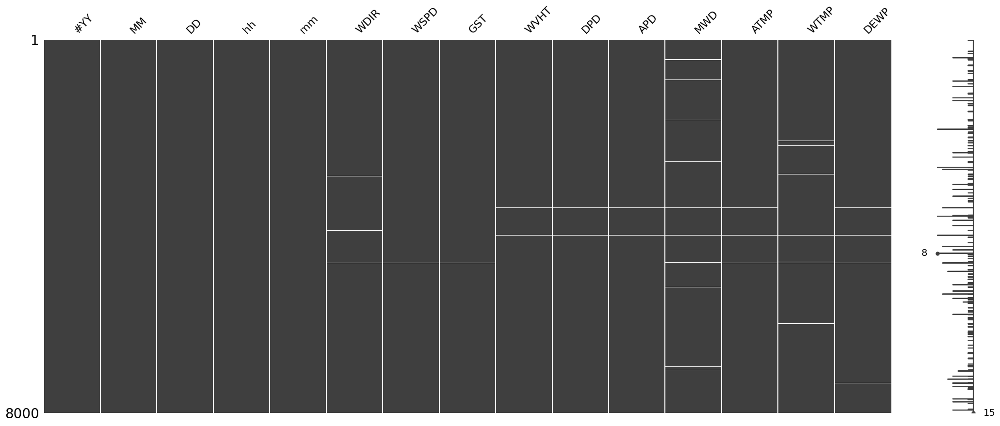

In [44]:
msno.matrix(df.sample(8000)) # ambil sampel sebanyak 8000 data

<Axes: >

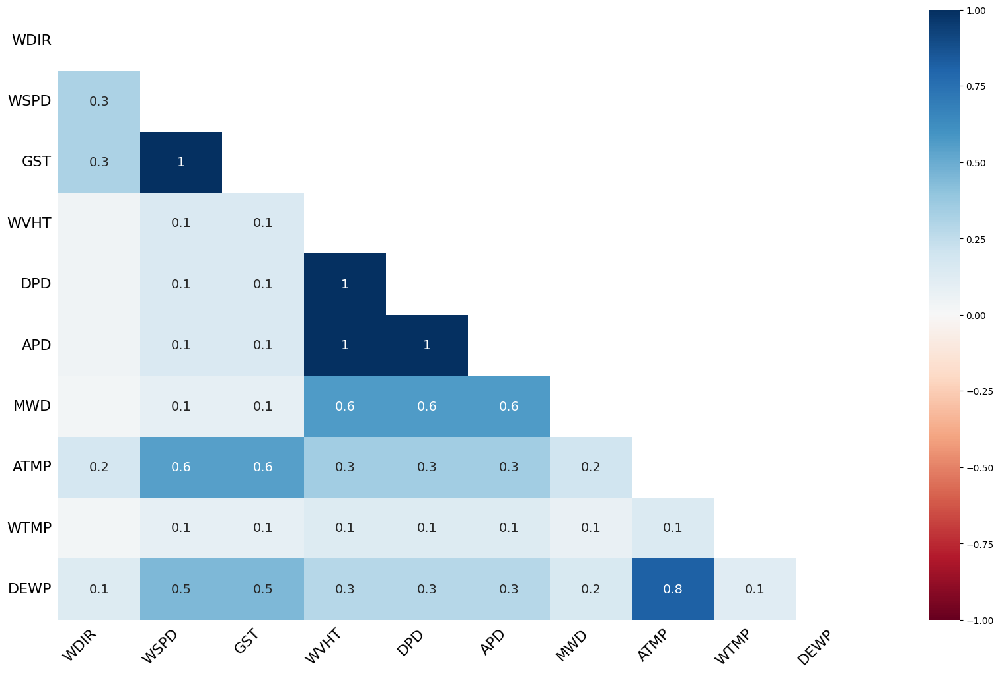

In [45]:
# Heatmap korelasi missing value dari tiap kolom
msno.heatmap(df)

Insight: Terdapat korelasi yang kuat antara missing value ATMP dan DEWP.

In [46]:
# Total missing value tiap kolom/variabel
print(df.isnull().sum())

#YY       0
MM        0
DD        0
hh        0
mm        0
WDIR    189
WSPD     19
GST      19
WVHT    217
DPD     217
APD     217
MWD     670
ATMP     63
WTMP    287
DEWP     95
dtype: int64


In [47]:
# Data (Rows) dengan missing value x variabel
# Gunakan fungsi data_with_missing_value(data, x=1)
mv_all_var = data_with_missing_value(df, x=1)

Nama Dataframe baru: df_missing_value
Total baris dengan 1 missing value (kolom): 884


,#YY,MM,DD,hh,mm,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
18,2020,1,1,18,40,81.0,6.5,8.4,3.15,10.81,7.80,NaN,24.7,25.7,17.9
25,2020,1,2,1,40,83.0,5.9,8.1,2.84,10.00,7.78,NaN,24.5,25.7,19.7
28,2020,1,2,4,40,NaN,6.4,7.9,2.84,10.00,7.73,88.0,25.0,25.7,19.4
385,2020,1,17,1,40,88.0,5.7,7.2,2.67,10.00,7.18,NaN,24.6,25.3,21.1
392,2020,1,17,8,40,NaN,6.0,7.6,2.37,10.00,6.98,83.0,24.7,25.2,22.1


In [48]:
# Melihat missing value pada tiap variabel
# Gunakan fungsi missing_values_in_cols(data, columns = [])
df_missing_value_cols = missing_values_in_cols(df, 'WTMP')

Nama Dataframe baru: df_missing_value_cols
Total baris dengan missing value di kolom WTMP: 287


,#YY,MM,DD,hh,mm,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
1070,2020,2,14,16,40,70.0,10.7,13.1,NaN,NaN,NaN,NaN,23.5,NaN,18.9
2004,2020,3,24,14,40,64.0,9.0,11.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005,2020,3,24,16,40,70.0,10.0,12.5,NaN,NaN,NaN,NaN,23.0,NaN,18.6
2007,2020,3,24,18,40,59.0,10.2,12.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008,2020,3,24,19,40,61.0,9.6,11.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43034,2024,12,8,8,40,62.0,5.9,7.4,2.56,9.09,7.44,104.0,25.4,NaN,21.6
43259,2024,12,17,17,40,73.0,5.4,6.6,1.92,9.09,6.98,105.0,25.3,NaN,23.0
43283,2024,12,18,17,40,87.0,6.0,7.9,2.20,10.00,7.44,102.0,25.1,NaN,22.4
43399,2024,12,23,13,40,53.0,7.0,9.0,4.78,17.39,11.43,354.0,24.9,NaN,20.5


In [49]:
# Data (Rows) dengan missing value > x variabel (kolom) -- Data dengan missing value yang akan dihapus
# Gunakan fungsi data_with_missing_value_more_than(data, x=1)
mv_more_than_x = data_with_missing_value_more_than(df, x=2)

Nama Dataframe baru: df_missing_value_more_than
Total baris dengan 2 missing value (kolom): 246


,#YY,MM,DD,hh,mm,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
801,2020,2,3,11,40,57.0,8.8,10.8,NaN,NaN,NaN,NaN,23.8,24.8,19.6
1070,2020,2,14,16,40,70.0,10.7,13.1,NaN,NaN,NaN,NaN,23.5,NaN,18.9
1168,2020,2,18,18,40,65.0,10.8,13.3,NaN,NaN,NaN,NaN,23.6,24.0,18.5
1634,2020,3,9,4,40,59.0,8.6,10.6,NaN,NaN,NaN,NaN,22.8,24.0,17.3
1828,2020,3,17,6,40,NaN,9.0,11.3,2.05,7.69,5.97,NaN,23.8,24.0,20.9


In [50]:
# Total missing value yang akan diimputasi di tiap variabel
one_mv = df[df.isnull().sum(axis=1) == 1] # data (baris) yang hanya memiliki satu missing value (kolom)
print(one_mv.isnull().sum())

#YY       0
MM        0
DD        0
hh        0
mm        0
WDIR    166
WSPD      0
GST       0
WVHT      0
DPD       0
APD       0
MWD     446
ATMP      0
WTMP    240
DEWP     32
dtype: int64


#### Hasil Identifikasi Missing Value

Setelah memeriksa jumlah missing value tiap data, diperoleh informasi:
- tidak ada data yang semua variabelnya kosong
- 10 data dengan jumlah missing value 9 (kecuali var waktu dan WTMP). –data tahun 2020, untuk tanggalnya cukup random. tapi mayoritas di bulan 7 sekitar tanggal 7-11
- tidak ada dengan jumlah missing value 8 variabel
- 12 data dengan jumlah missing value 7 (WVHT, DPD, APD, MWD, ATMP, WTMP, DEWP) –data tanggal 24-25 Maret 2020
- 26 data dengan jumlah missing value 6 variabel 
1. 7 data missing WDIR, WSPD, GST, ATMP, WTMP, DEWP. –periode waktu random kecuali 2 data di 2023 tanggal 18 dan 19 April jam yang sama 1:40
2. 19 data missing WVHT, DPD, APD, MWD, ATMP, DEWP. –periode waktu mayoritas 7-10 Juli 2020 jam random–14 data.
- 25 data dengan jumlah missing value 5 variabel
1. 23 data missing WVHT, DPD, APD, MWD, WTMP. –periode waktu random, mayoritas 8-11 Juli 2020 jam random.
2. 2 data missing WDIR, WSPD, GST, ATMP, DEWP. – periode waktu 18-19 Maret 2021 jam 19:40 dan 4:40 berurutan.
- 153 data dengan jumlah missing value 4 variabel: WVHT, DPD, APD, MWD. –periode waktu mayoritas:
1. 7-10 Juli 2020 jam random
2. 8-18 Agustus 2022 jam random
- 2 data dengan jumlah missing value 3 variabel:
1. ATMP, WTMP, DEWP
2. MWD, ATMP, DEWP
- 18 data dengan jumlah missing value 2 variabel:
1. WDIR, MWD 3 data
2. WDIR, WTMP 1 data
3. MWD, WTMP 3 data
4. ATMP, DEWP 11 data
- 884 data dengan jumlah missing value 1 variabel


Dengan total 246 data (246/43555 = ~0.56%) dengan >=2 variabel kosong dan 884 data dengan 1 variabel kosong.
Untuk mengurangi "manipulasi" data, 246 baris tersebut akan dihapus dan 884 baris dengan 1 missing variable akan diimputasi sesuai hasil analisa outlier nantinya.

#### Kesimpulan

Langkah selanjutnya untuk Exploratory Data Analysis:
- Melakukan analisis outlier untuk melihat metode imputasi apa yang cocok untuk missing value variabel WDIR, MWD, WTMP, dan DEWP.
- Melihat distribusi data untuk memahami data lebih lanjut guna mengetahui proses yang harus dilakukan di Data Pre-Processing.

Langkah yang harus dilakukan saat Data Pre-Processing:
1. Menghapus 246 data (baris) dengan missing value >= 2 variabel.
2. Mengimputasi missing values di kolom WDIR, MWD, WTMP, dan DEWP.

### Visualization

#### Data Distribution

In [51]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
#YY,43602.0,2022.006766,1.415405,2020.00,2021.00,2022.00,2023.00,2024.00
MM,43602.0,6.531971,3.449192,1.00,4.00,7.00,10.00,12.00
DD,43602.0,15.750333,8.815427,1.00,8.00,16.00,23.00,31.00
hh,43602.0,11.498555,6.921805,0.00,5.00,11.00,17.00,23.00
mm,43602.0,40.000000,0.000000,40.00,40.00,40.00,40.00,40.00
WDIR,43413.0,72.848456,30.050812,1.00,59.00,69.00,80.00,360.00
WSPD,43583.0,7.469298,1.839635,0.00,6.50,7.60,8.70,16.10
GST,43583.0,9.370635,2.232382,0.20,8.10,9.50,10.80,20.80
WVHT,43385.0,2.261304,0.574222,0.89,1.85,2.16,2.56,6.35
DPD,43385.0,10.354940,2.872702,4.55,8.33,9.09,12.12,23.53


Waktu
- Waktu terdistribusi merata sesuai siklus waktu.
- Kolom 'mm' memiliki nilai konstan 40--pengambilan data di menit ke-40 tiap jam. Kolom ini dapat dihapus karena tidak informatif untuk model.

Angin
- WDIR: Arah angin bervariasi (1-360), tapi mean-nya rendah (72), yang berarti dominan dari arah timur atau timur laut.
- WSPD: Kecepatan angin rata-rata ~7.47 m/s dengan maksimum 16.10 m/s. Dapat dikarenakan angin kencang.
- GST: memiliki nilai maksimum 20.80 m/s, kemungkinan badai kecil atau angin sangat kencang.

Gelombang Laut
- WVHT: Tinggi gelombang cukup kecil-sedang (0.89m-6.35m).
- DPD & APD: Rata-rata periode gelombang dominan 10.3. dan rata-rata periode gelombang keseluruhan 6.6 detik. Nilai outlier mungkin terlihat di nilai max (23.53 dan 15.23).
- MWD: Arah datang gelombang sangat bervariasi Dengan rata-rata 125 dan standar deviasi 101.2, arah asal gelombang sangat acak.

Temperatur dan Kelembapan
- ATMP: Suhu udara berkisar 19.6-27.9 C, cukup stabil (std ~1 C).
- WTMP: Suhu air laut juga stabil ~25.5 C, sedikit lebih hangat dari udara.
- DEWP: Titik embun menunjukkan kelembapan cukup tinggi -- perbedaan dengan ATMP kecil.

Histogram

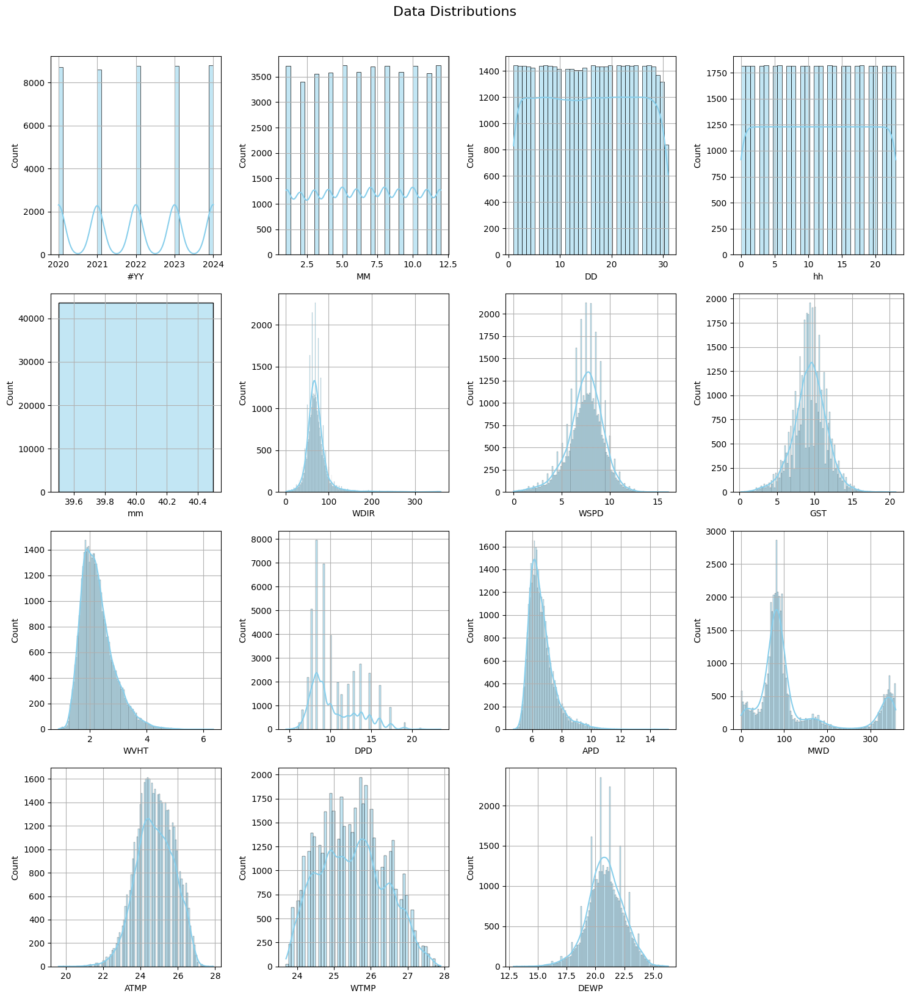

In [52]:
# Gunakan fungsi data_histogram(data)
data_histogram(df)

#### Time Series Plot - Wind Speed Trend

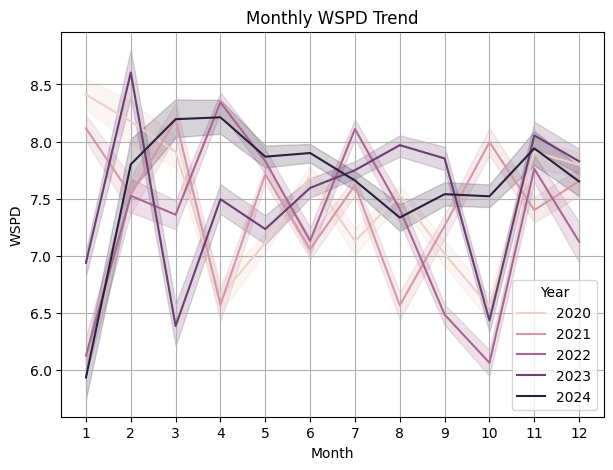

In [53]:
# Gunakan fungsi plot_monthly_trend(df, y_col, x_col="MM", hue_col="#YY")
plot_monthly_trend(df, 'WSPD', x_col="MM", hue_col="#YY")

Perbedaan tren bulanan kecepatan angin selama 4 tahun (2020-2023) cukup signifikan.

#### Time Series Plot - Wave Height Trend Over 3 Years

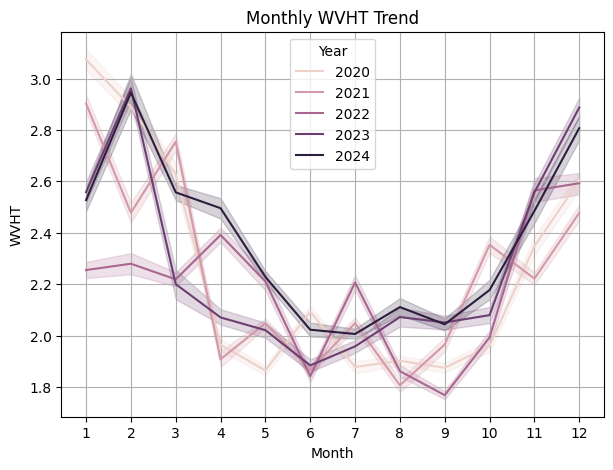

In [54]:
# Gunakan fungsi plot_monthly_trend(df, y_col, x_col="MM", hue_col="#YY")
plot_monthly_trend(df, 'WVHT', x_col="MM", hue_col="#YY")

Perbedaan tren bulanan tinggi gelombang selama 4 tahun (2020-2023) cukup signifikan di tiap awal tahun. Namun, sekitar pertengahan tahun, khususnya di bulan ke-6 (Juni), tren di setiap tahunnya cukup mirip, kecuali untuk tahun 2020. Tren yang awalnya cukup tinggi di awal tahun mengalami penurunan di sekitar pertengahan tahun. Kemiripan lain dari tren di tiap tahun terlihat di sekitar akhir tahun, dimana tren ketinggian gelombang meningkat signifikan dibanding bulan-bulan sebelumnya.

Kesimpulan:
- Terdapat perbedaan yang cukup signifikan terhadap pola tren di awal tahun (2020-2023).
- Tren ketinggian gelombang cenderung menurun di sekitar pertengahan tahun (2020-2023).
- Tren ketinggian gelombang meningkat secara signifikan menjelang akhir tahun (2020-2023).

#### Correlation Heatmap

##### Overall

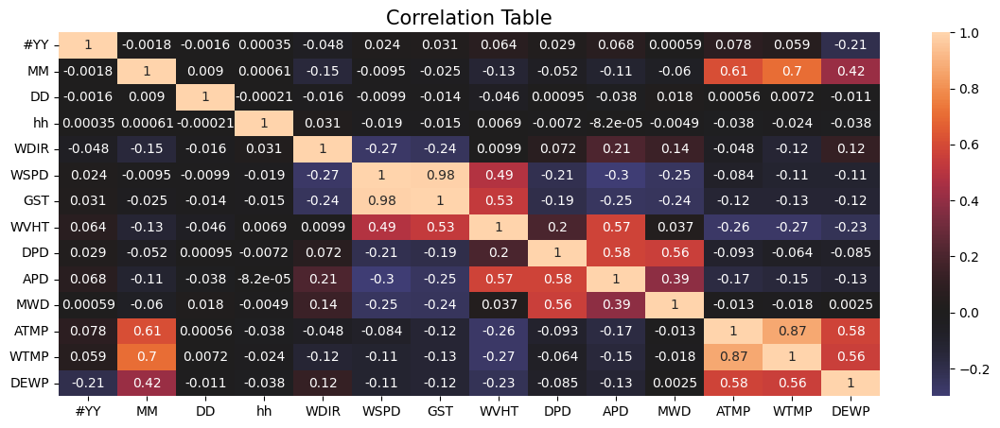

In [55]:
df_corr = df.corr().drop(index="mm", columns="mm")

plt.figure(figsize=(14,5))
sns.heatmap(df_corr, annot=True, center=0)
plt.title("Correlation Table", fontsize=15)
plt.show()

##### Wind Speed and Wave Height

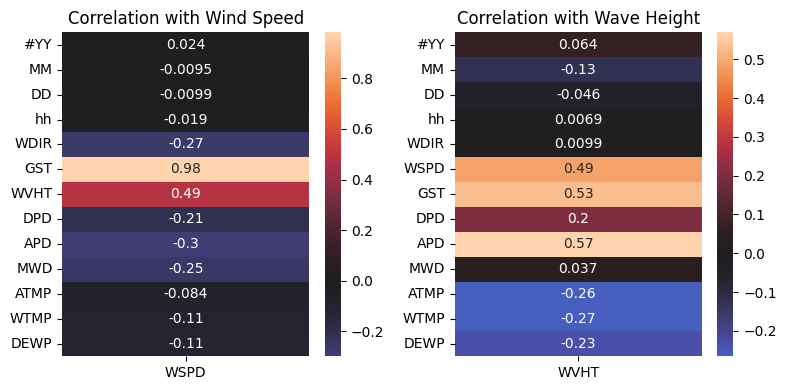

In [56]:
wspd_corr = df_corr["WSPD"].drop("WSPD")
wvht_corr = df_corr["WVHT"].drop("WVHT")

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
axs = axs.flatten()

sns.heatmap(wspd_corr.to_frame(), annot=True, center=0, ax=axs[0])
axs[0].set_title("Correlation with Wind Speed")

sns.heatmap(wvht_corr.to_frame(), annot=True, center=0, ax=axs[1])
axs[1].set_title("Correlation with Wave Height")

plt.tight_layout()
plt.show()

Dilihat dari skor korelasi antar variabel-variabel waktu dengan WVHT dan WSPD, terlihat bahwa variabel" waktu memiliki tingkat korelasi yang cukup kecil dibanding variabel" lain.
Dan korelasi WVHT terlihat sedikit lebih "menarik" untuk diteliti, karena korelasi WVHT dengan variabel" waktu lebih kecil, maka hasil prediksi WVHT akan lebih bergantung pada variabel lainnya seperti WSPD, GST, APD, etc. Tapi kalau mau coba prediksi dua"nya juga boleh.

## Outlier Analysis

### Outlier Visualization

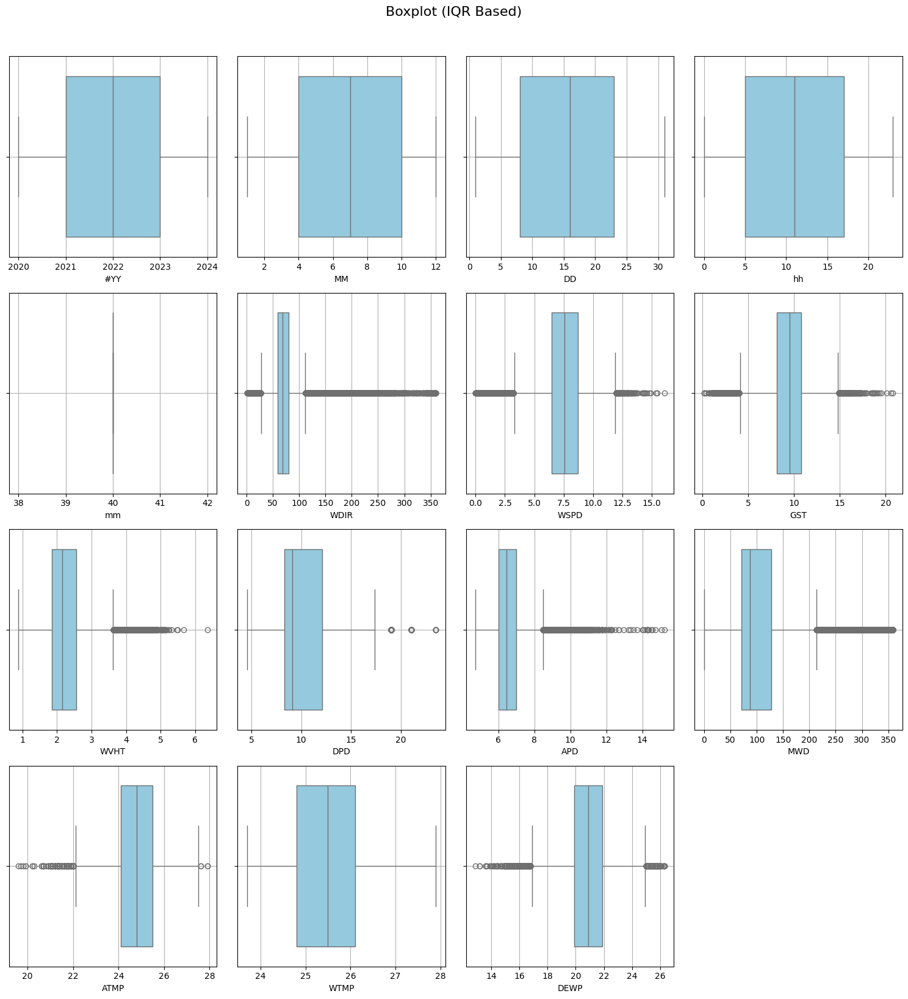

In [57]:
# Gunakan fungsi data_boxplot(data)
data_boxplot(df)

Boxplot menunjukkan adanya outlier di beberapa variabel seperti WDIR, WSPD, GST, WVHT, DPD, APD, MWD, ATMP, dan DEWP.

1. WDIR: Arah angin memiliki sangat banyak outlier. Hal ini dapat dikarenakan arah angin yang memang sangat bervariasi (0–360°).
2. WSPD, GST: Ada outlier di arah kanan dan kiri (cenderung di kanan) dapat dikarenakan angin yang sangat pelan juga angin yang sangat kencang.
3. WVHT: Ada outlier tinggi gelombang (>6 meter), tapi sebagian besar data di bawah 3 m.
5. DPD: Sebagian besar data cukup seimbang, namun ada beberapa outlier ekstrem > 17 detik
6. APD: banyak outlier melebihi nilai maksimum IQR (periode sangat panjang), indikasi kondisi lut tak biasa.
7. MWD: Rata-rata arah kedatangan gelombang memiliki outlier cukup banyak melebihi nilai maksimum IQR (> 200~360 derajat), menandakan banyak outlier gelombang dari arah barat daya, barat, dan barat laut. Hal ini dapat dikarenakan titik pengambilan data adalah diatas laut lepas, sehingga angin berdatangan dari segala arah.
8. ATMP: Ada outlier di kanan dan kiri. Untuk outlier di sisi kiri kemungkinan ketika hari hujan atau badai.
9. WTMP: Tidak ada outlier.
10. DEWP:  Terdapat outlier di kanan dan kiri.

Kesimpulan:
- Untuk beberapa variabel seperti WDIR dan MWD, meski terlihat ada banyak outlier, jumlah outlier terlalu banyak sehingga dapat dikatakan bukan outlier melainkan variasi data yang memang memungkinkan terjadi. Dapat dilakukan penanganan terhadap dua variabel ini berupa transformasi atau konversi nilai-nilainya menjadi sin/cos.
- Untuk variabel WSPD, GST, WVHT, DPD, APD, ATMP, dan DEWP akan dilakukan penanganan outlier (imputasi, trimming, atau transformasi).
- Untuk variabel-variabel waktu dan WTMP tidak perlu dilakukan penanganan outlier karena tidak ada outlier.

### IQR

Tanpa partisi.

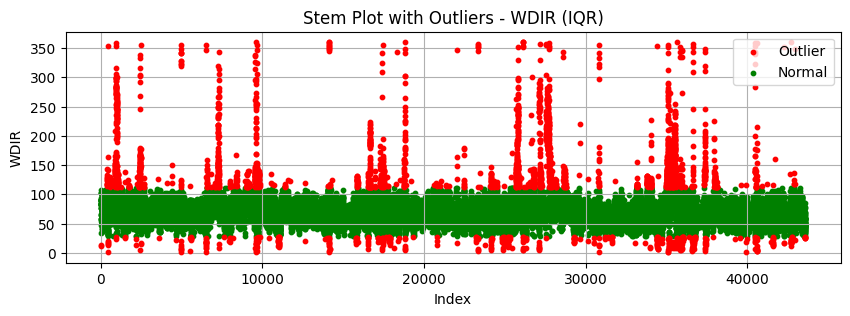

total outlier WDIR: 2737


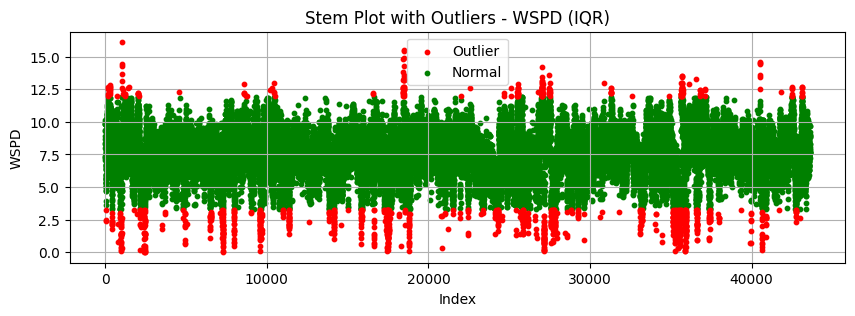

total outlier WSPD: 1301


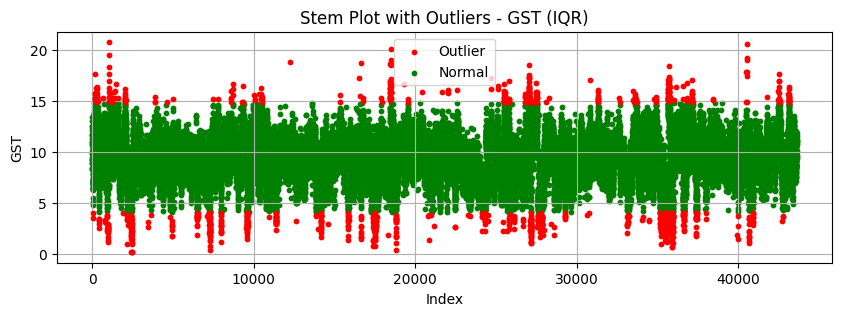

total outlier GST: 1106


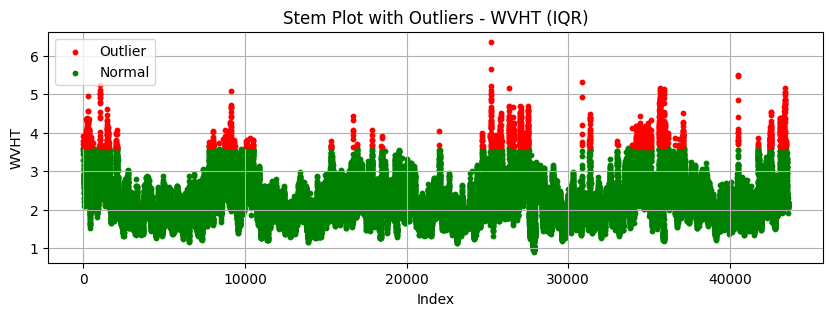

total outlier WVHT: 1163


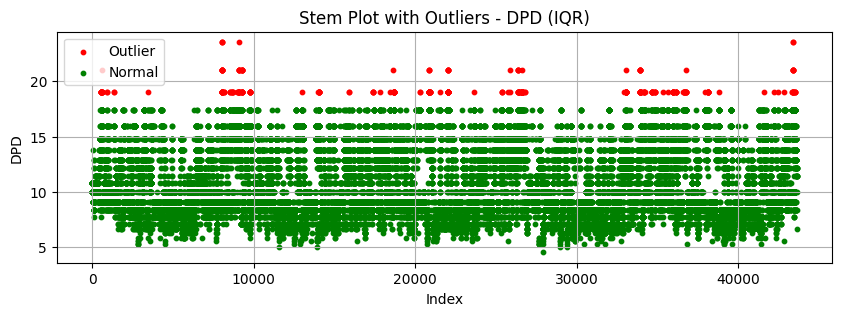

total outlier DPD: 336


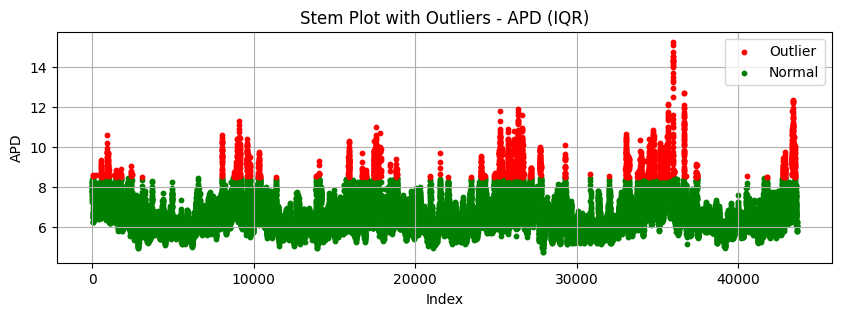

total outlier APD: 1874


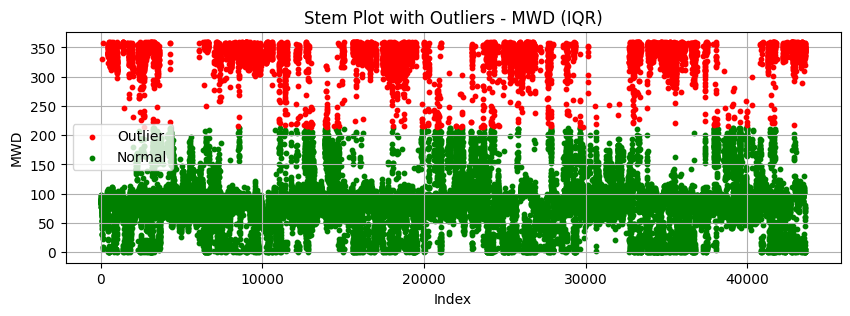

total outlier MWD: 7385


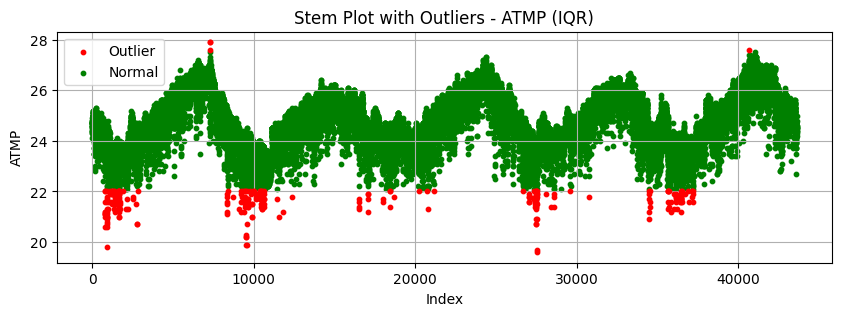

total outlier ATMP: 268


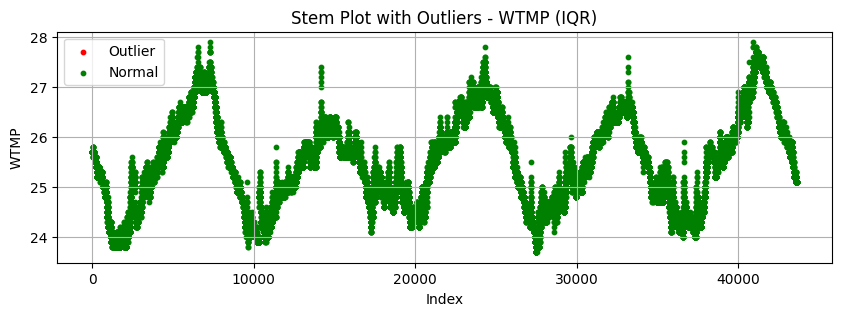

total outlier WTMP: 0


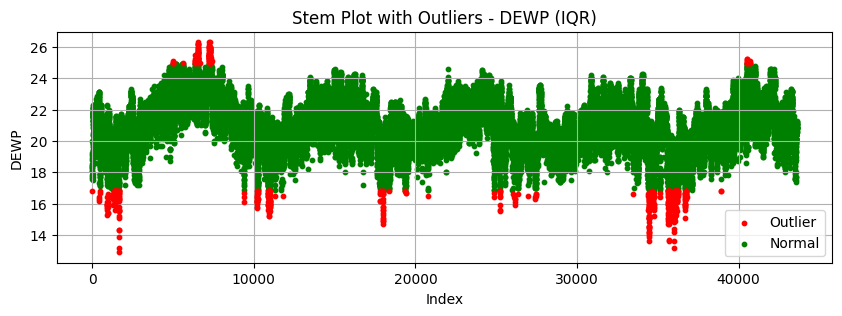

total outlier DEWP: 610


,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,True,False,False,False,False,False,False
3,False,False,False,True,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
43597,False,False,False,False,False,False,False,False,False,False
43598,False,False,False,False,False,False,False,False,False,False
43599,False,False,False,False,False,False,True,False,False,False
43600,False,False,False,False,False,False,True,False,False,False


,Column,Outlier_Count
0,WDIR,2737
1,WSPD,1301
2,GST,1106
3,WVHT,1163
4,DPD,336
5,APD,1874
6,MWD,7385
7,ATMP,268
8,WTMP,0
9,DEWP,610


In [58]:
data = df.copy()
columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
visualize_outliers(data, columns=columns, method='iqr', threshold=3)
df_outliers_count, mask_iqr = count_outliers_iqr(data, columns=columns)
display(mask_iqr)
display(df_outliers_count)

In [59]:
# Cek index dari outlier
data = mask_iqr.copy()
column_name = 'GST'
outlier_idx = data[data[column_name] == True].index
print(" Index untuk baris dengan outlier:", outlier_idx.tolist())

 Index untuk baris dengan outlier: [36, 37, 167, 169, 171, 179, 185, 201, 266, 279, 299, 301, 302, 303, 305, 306, 307, 310, 345, 407, 408, 409, 410, 411, 412, 699, 767, 768, 908, 944, 946, 947, 948, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 963, 964, 965, 1008, 1009, 1022, 1023, 1024, 1025, 1029, 1030, 1031, 1032, 1033, 1096, 1113, 1194, 1205, 1208, 1215, 1377, 1399, 1406, 1476, 1621, 1941, 2015, 2016, 2018, 2024, 2025, 2026, 2031, 2032, 2034, 2072, 2168, 2169, 2177, 2181, 2220, 2403, 2410, 2411, 2412, 2413, 2414, 2416, 2421, 2423, 2424, 2425, 2426, 2427, 2431, 2433, 2434, 2435, 2451, 2452, 2453, 2454, 2455, 2456, 2457, 2458, 2459, 2460, 2461, 2467, 2468, 3481, 3482, 3671, 3888, 3895, 3917, 4638, 4837, 4950, 4951, 4952, 4953, 4954, 4955, 4956, 4986, 6490, 6491, 6495, 6497, 6498, 6500, 6511, 6513, 6514, 6515, 6516, 6517, 6518, 6522, 6523, 6524, 7079, 7213, 7214, 7215, 7216, 7217, 7219, 7220, 7221, 7238, 7239, 7244, 7247, 7264, 7265, 7266, 7267, 7268, 7269, 7270, 7271, 

Dengan partisi.

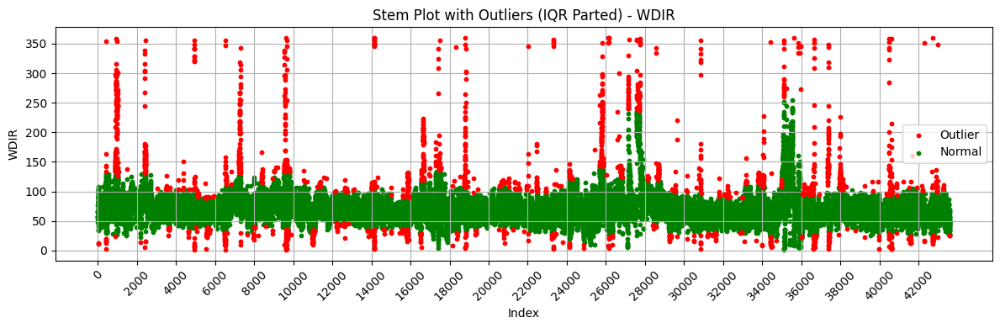

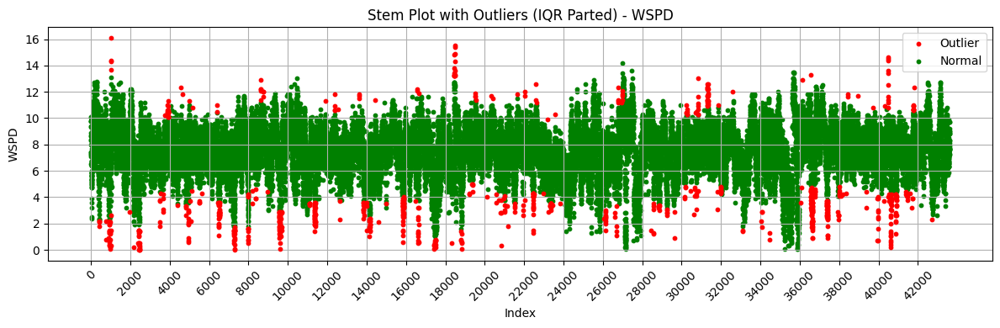

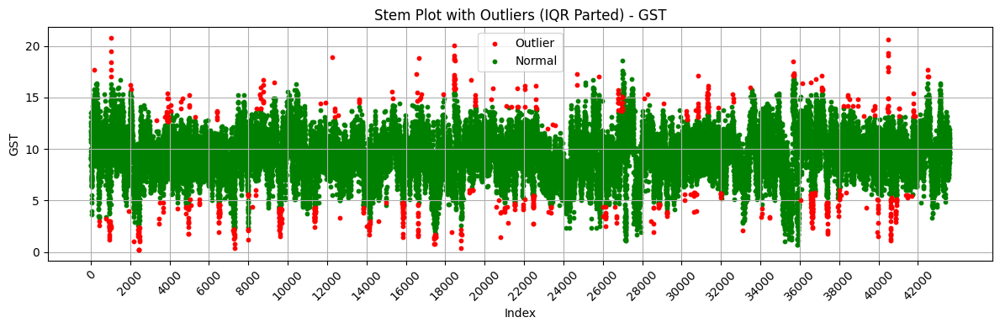

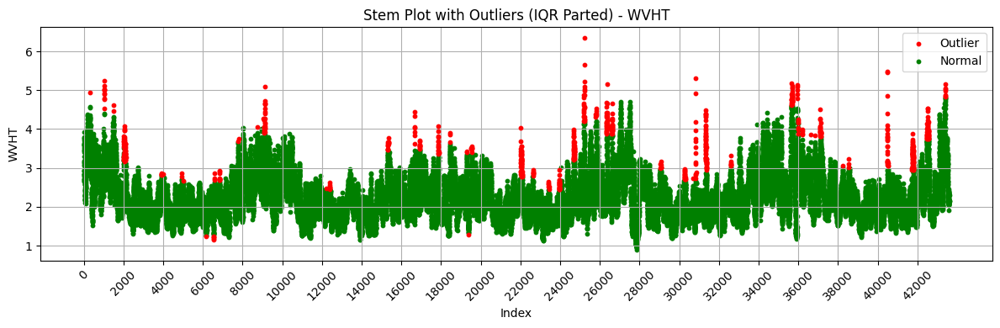

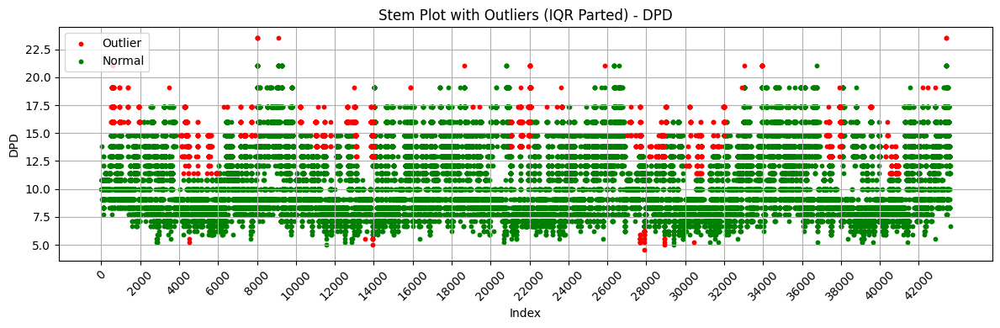

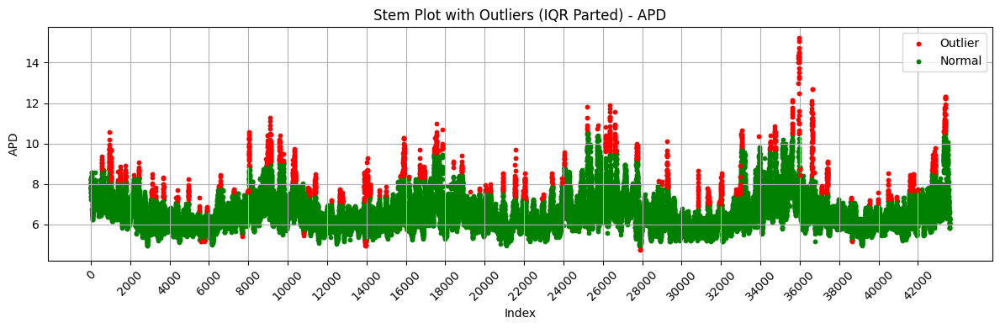

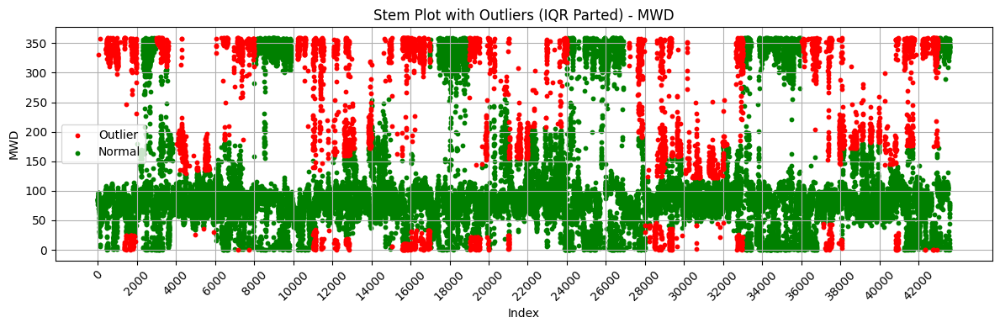

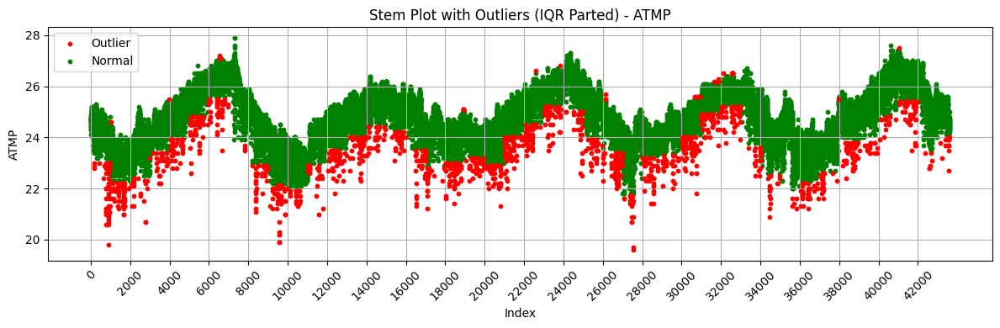

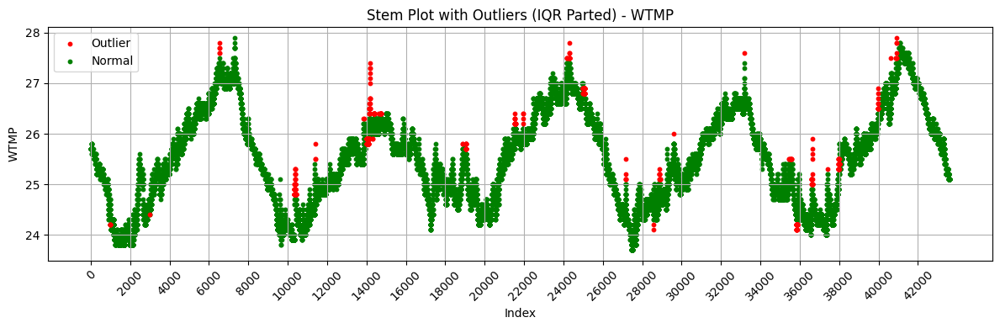

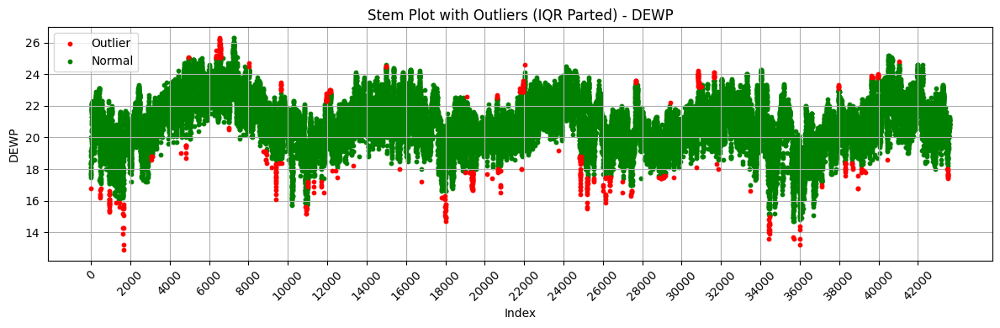

,Column,Outlier_Count
0,WDIR,1935
1,WSPD,830
2,GST,777
3,WVHT,733
4,DPD,1596
5,APD,1479
6,MWD,5038
7,ATMP,1666
8,WTMP,468
9,DEWP,501


,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
43597,False,False,False,False,False,False,False,False,False,False
43598,False,False,False,False,False,False,False,False,False,False
43599,False,False,False,False,False,False,False,False,False,False
43600,False,False,False,False,False,False,False,False,False,False


In [60]:
data = df.copy()
columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
visualize_outliers_parted_combined(data, columns=columns, method='iqr', x=1000)
df_outliers_count, mask_iqr_parted = count_outliers_iqr_parted(data, x=1000, columns=columns)
display(df_outliers_count, mask_iqr_parted)

### MAD (final method with partition per-500 data)

Tanpa partisi.

In [61]:
#data = df.copy()
#columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
#visualize_outliers(data, columns=columns, method='mad', threshold=3)
#df_outliers_count, mask_mad = count_outliers_mad(data, columns=columns)
#display(mask_mad)

In [62]:
# Cek index dari outlier
#data = mask_mad.copy()
#column_name = 'GST'
#outlier_idx = data[data[column_name] == True].index
#print(" Index untuk baris dengan outlier:", outlier_idx.tolist())

Dengan partisi.

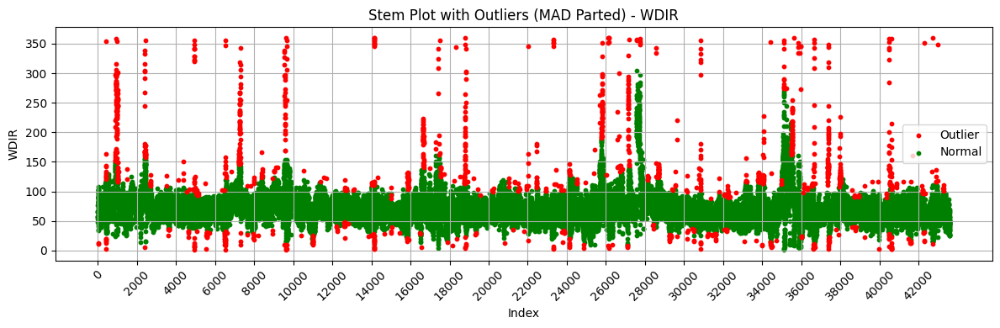

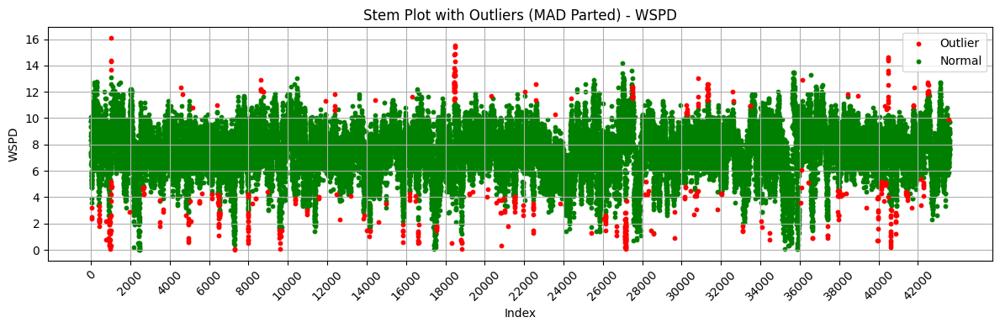

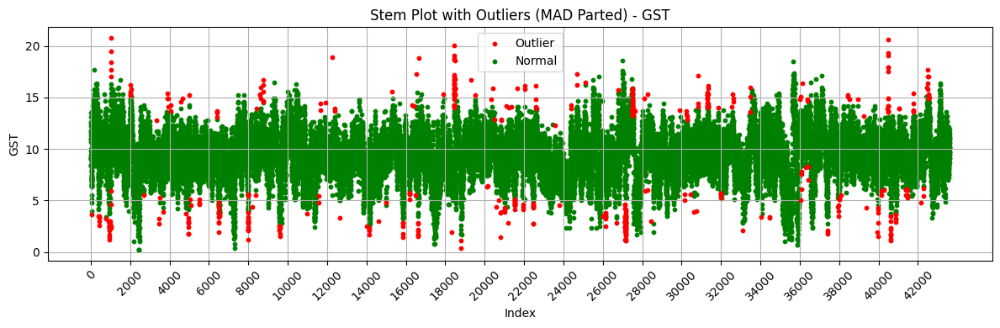

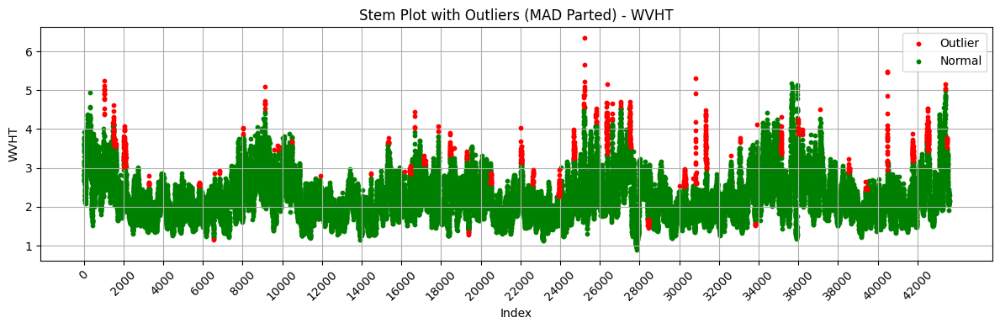

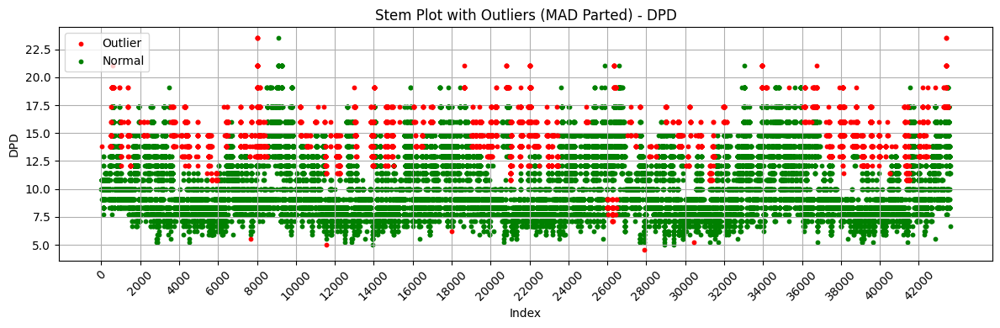

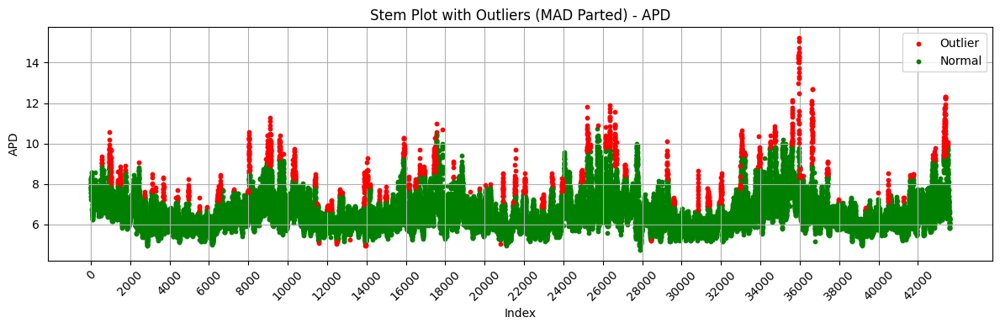

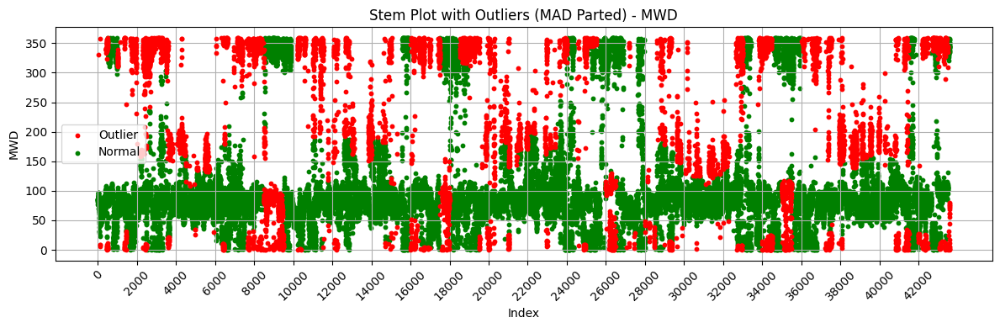

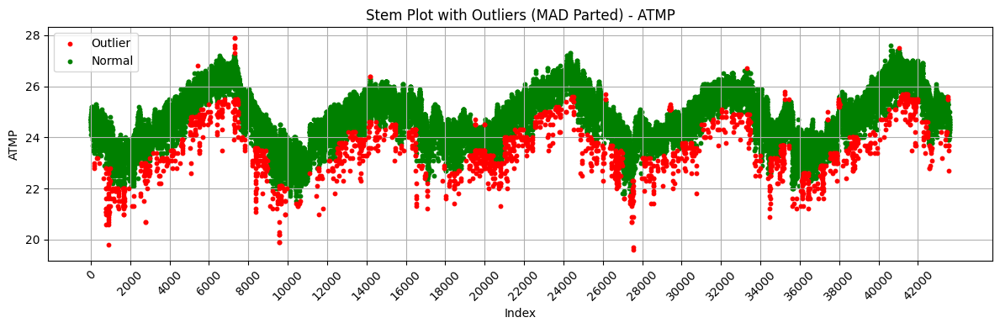

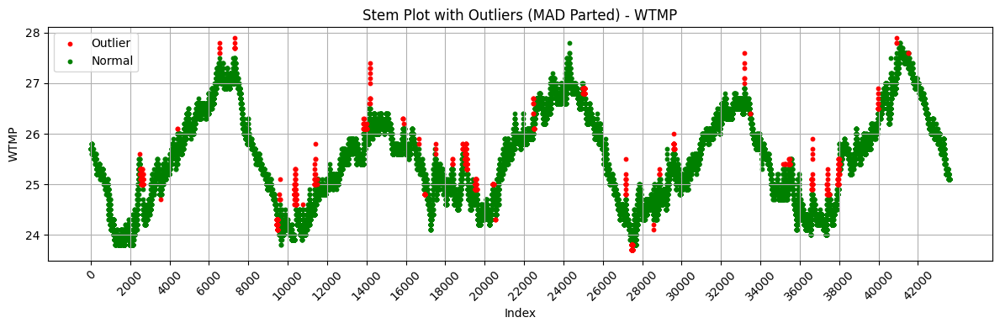

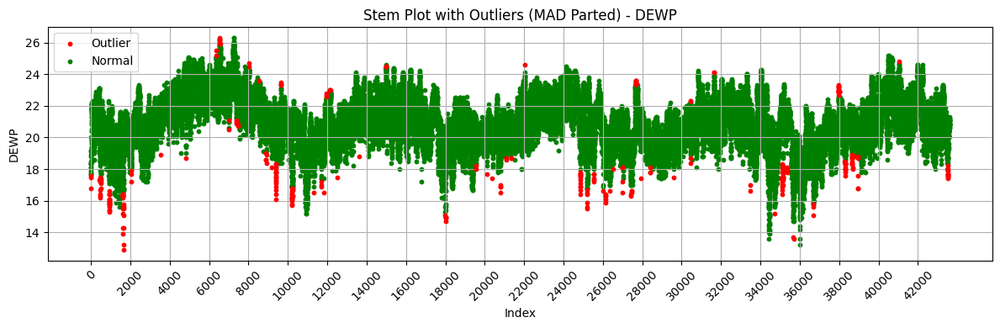

,Column,Outlier_Count
0,WDIR,1391
1,WSPD,528
2,GST,489
3,WVHT,835
4,DPD,3515
5,APD,1424
6,MWD,6862
7,ATMP,1846
8,WTMP,975
9,DEWP,326


,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
43597,False,False,False,False,False,False,True,False,False,False
43598,False,False,False,False,False,False,True,False,False,False
43599,False,False,False,False,False,False,False,False,False,False
43600,False,False,False,False,False,False,False,False,False,False


In [63]:
# Definisikan dataframe dan list kolom yang ingin dicek outliernya
data = df.copy()
columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
# Visualisasikan outlier menggunakan fungsi visualize_outliers_parted_combined()
visualize_outliers_parted_combined(data, columns=columns, method='mad', x=500)    # metode yang digunakan adalah mad
                                                                                # outlier dideteksi untuk tiap 500 data
# Hitung outlier tiap kolom menggunakan fungsi count_outliers_mad_parted()
# Return dari fungsi adalah dataframe
df_outliers_count, mask_mad_parted = count_outliers_mad_parted(df, x=500, columns=columns)
display(df_outliers_count, mask_mad_parted)

### Perbandingan IQR dan MAD

Tanpa partisi.

In [64]:
def mask_matching_value_at_index(df1, df2, column_name, value):
    """
    Returns a Boolean DataFrame indicating whether each row in df1 and df2 has the
    specified value in the given column at the same index.
    
    Parameters:
    - df1, df2: pandas DataFrames (must share some index)
    - column_name: column to compare
    - value: the value to check for
    
    Returns:
    - Boolean DataFrame where True means both df1 and df2 have `value` in column_name at that index
    """
    common_index = df1.index.intersection(df2.index)
    mask = (df1.loc[common_index, column_name] == value) & (df2.loc[common_index, column_name] == value)
    return mask.to_frame(name=f'match_{value}')

In [65]:
#df1 = mask_iqr
#df2 = mask_mad
#column_name = 'MWD'
#value = True
#match = mask_matching_value_at_index(df1, df2, column_name, value)
#display(match)

# To check the total rows where match is True in the 'match_True' column:
#total_matches = match['match_True'].sum()

#print("Total rows where the value is True in both DataFrames:", total_matches)

# Data Preprocessing

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43602 entries, 0 to 43601
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   #YY     43602 non-null  int64  
 1   MM      43602 non-null  int64  
 2   DD      43602 non-null  int64  
 3   hh      43602 non-null  int64  
 4   mm      43602 non-null  int64  
 5   WDIR    43413 non-null  float64
 6   WSPD    43583 non-null  float64
 7   GST     43583 non-null  float64
 8   WVHT    43385 non-null  float64
 9   DPD     43385 non-null  float64
 10  APD     43385 non-null  float64
 11  MWD     42932 non-null  float64
 12  ATMP    43539 non-null  float64
 13  WTMP    43315 non-null  float64
 14  DEWP    43507 non-null  float64
dtypes: float64(10), int64(5)
memory usage: 5.0 MB


### Drop column 'mm'

Hapus kolom 'mm' sebelum melakukan Data Preprocessing.

In [67]:
# Hapus kolom mm karena nilainya konstan
df_new = df.drop(columns=["mm"])
df_new.head()

,#YY,MM,DD,hh,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,2020,1,1,0,54.0,9.8,12.2,3.53,10.00,7.40,81.0,24.8,25.7,19.1
1,2020,1,1,1,57.0,10.0,13.1,3.60,10.00,7.34,84.0,24.8,25.7,18.9
2,2020,1,1,2,58.0,8.3,10.8,3.92,10.81,7.58,84.0,24.1,25.7,18.1
3,2020,1,1,3,48.0,8.9,11.7,3.78,10.00,7.81,77.0,24.4,25.7,20.0
4,2020,1,1,4,57.0,9.8,13.5,3.44,10.81,7.23,83.0,24.5,25.7,19.2


## Handling Missing Values

1. Hapus 246 data dengan missing value >= 2 variabel.

In [68]:
# Definisikan dataframe baru
df_wo_mv = df_new[~(df_new.isnull().sum(axis=1) >= 2 )] # mengambil baris dengan missing value < 2
print(df_wo_mv.shape)
df_wo_mv.head()

(43356, 14)


,#YY,MM,DD,hh,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,2020,1,1,0,54.0,9.8,12.2,3.53,10.00,7.40,81.0,24.8,25.7,19.1
1,2020,1,1,1,57.0,10.0,13.1,3.60,10.00,7.34,84.0,24.8,25.7,18.9
2,2020,1,1,2,58.0,8.3,10.8,3.92,10.81,7.58,84.0,24.1,25.7,18.1
3,2020,1,1,3,48.0,8.9,11.7,3.78,10.00,7.81,77.0,24.4,25.7,20.0
4,2020,1,1,4,57.0,9.8,13.5,3.44,10.81,7.23,83.0,24.5,25.7,19.2


In [69]:
# Cek kembali jumlah missing value
df_wo_mv.isnull().sum()

#YY       0
MM        0
DD        0
hh        0
WDIR    166
WSPD      0
GST       0
WVHT      0
DPD       0
APD       0
MWD     446
ATMP      0
WTMP    240
DEWP     32
dtype: int64

2. Imputasi missing value di kolom WDIR, MWD, WTMP, dan DEWP.

Untuk missing values yang terdapat di kolom WDIR, MWD, WTMP, dan DEWP adalah MCAR. Dimana missing value acak dan tidak bergantung pada variabel lain maupun variabel itu sendiri.

<Axes: >

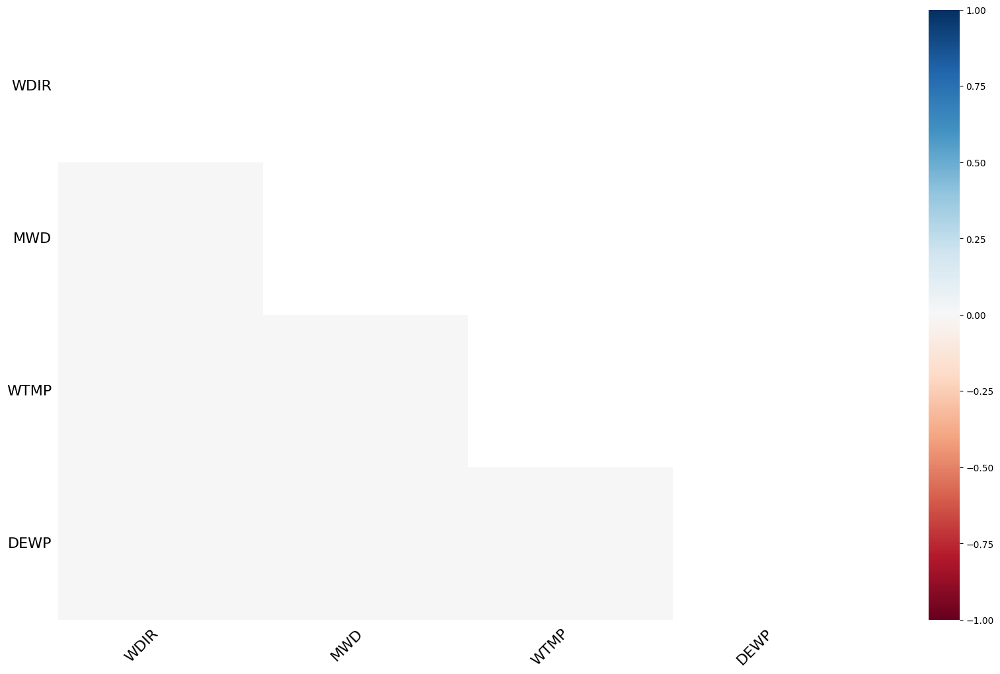

In [70]:
msno.heatmap(df_wo_mv)

WDIR dan MWD

Karena kedua variabel ini siklik, WDIR dan MWD akan diimputasi dengan metode interpolasi cubic spline.

In [71]:
# Gunakan fungsi impute_direction_simple(data, column_name)
# Tanpa transformasi ke sin dan cos

# WDIR
df_imputed = impute_direction_simple(df_wo_mv, 'WDIR')
# MWD
df_imputed = impute_direction_simple(df_imputed, 'MWD')

df_imputed.isnull().sum()

#YY       0
MM        0
DD        0
hh        0
WDIR      0
WSPD      0
GST       0
WVHT      0
DPD       0
APD       0
MWD       0
ATMP      0
WTMP    240
DEWP     32
dtype: int64

WTMP dan DEWP

Karena WTMP dan DEWP tidak terlalu fluktuatif dan cenderung sama/tidak jauh berbeda untuk data-data yang diambil dalam waktu berdekatan, maka akan diterapkan imputasi menggunakan metode gabungan forward & backward fill.

In [72]:
# Definisikan dataframe baru
df_imputed2 = df_imputed.copy()

# Imputasi WTMP menggunakan forward fill dan backward fill
df_imputed2['WTMP'] = df_imputed2['WTMP'].ffill().bfill()

# Imputasi DEWP menggunakan forward fill dan backward fill
df_imputed2['DEWP'] = df_imputed2['DEWP'].ffill().bfill()

# Cek kembali jumlah missing value
df_imputed2.isnull().sum()

#YY     0
MM      0
DD      0
hh      0
WDIR    0
WSPD    0
GST     0
WVHT    0
DPD     0
APD     0
MWD     0
ATMP    0
WTMP    0
DEWP    0
dtype: int64

Definisikan df_clean sebagai dataframe yang sudah dibersihkan dari missing value.

In [73]:
# Copy dataframe
df_clean = df_imputed2.copy()

# Perbarui index
df_clean.reset_index(drop=True, inplace=True)

df_clean

,#YY,MM,DD,hh,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,2020,1,1,0,54.0,9.8,12.2,3.53,10.00,7.40,81.0,24.8,25.7,19.1
1,2020,1,1,1,57.0,10.0,13.1,3.60,10.00,7.34,84.0,24.8,25.7,18.9
2,2020,1,1,2,58.0,8.3,10.8,3.92,10.81,7.58,84.0,24.1,25.7,18.1
3,2020,1,1,3,48.0,8.9,11.7,3.78,10.00,7.81,77.0,24.4,25.7,20.0
4,2020,1,1,4,57.0,9.8,13.5,3.44,10.81,7.23,83.0,24.5,25.7,19.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43351,2024,12,31,19,65.0,9.7,11.9,2.13,10.00,5.80,12.0,24.6,25.1,20.6
43352,2024,12,31,20,68.0,9.0,11.3,2.16,11.43,5.81,6.0,24.6,25.1,20.9
43353,2024,12,31,21,61.0,8.9,10.7,2.15,12.12,6.04,350.0,24.8,25.1,21.1
43354,2024,12,31,22,69.0,7.6,9.7,2.29,11.43,6.06,350.0,24.5,25.1,21.3


## Fixing MWD & WDIR value range

In [74]:
# Copy dataframe
data = df_clean.copy()

# Mengganti nilai 0 menjadi 360 dalam variabel MWD dan WDIR agar range nilai menjadi 1-360
data['MWD'] = data['MWD'].replace(0, 360)
data['WDIR'] = data['WDIR'].replace(0, 360)

# Definisikan kembali dataframe baru
df_transformed_mwd = data.copy()

## Analyzing & Handling Outliers

In [75]:
df_clean2 = df_transformed_mwd.copy()

In [76]:
df_clean2.describe().T

,count,mean,std,min,25%,50%,75%,max
#YY,43356.0,2022.011925,1.415199,2020.000000,2021.00,2022.00,2023.00,2024.00
MM,43356.0,6.531668,3.454959,1.000000,4.00,7.00,10.00,12.00
DD,43356.0,15.767414,8.824888,1.000000,8.00,16.00,23.00,31.00
hh,43356.0,11.495733,6.920446,0.000000,5.00,11.00,17.00,23.00
WDIR,43356.0,72.962083,30.094150,1.000000,59.00,69.00,80.00,360.00
WSPD,43356.0,7.464602,1.839964,0.000000,6.50,7.60,8.70,16.10
GST,43356.0,9.365110,2.232378,0.200000,8.10,9.50,10.80,20.80
WVHT,43356.0,2.261359,0.574229,0.890000,1.85,2.16,2.56,6.35
DPD,43356.0,10.355712,2.873055,4.550000,8.33,9.09,12.12,23.53
APD,43356.0,6.621263,0.895986,4.730000,6.02,6.43,7.00,15.23


In [77]:
df_clean2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43356 entries, 0 to 43355
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   #YY     43356 non-null  int64  
 1   MM      43356 non-null  int64  
 2   DD      43356 non-null  int64  
 3   hh      43356 non-null  int64  
 4   WDIR    43356 non-null  float64
 5   WSPD    43356 non-null  float64
 6   GST     43356 non-null  float64
 7   WVHT    43356 non-null  float64
 8   DPD     43356 non-null  float64
 9   APD     43356 non-null  float64
 10  MWD     43356 non-null  float64
 11  ATMP    43356 non-null  float64
 12  WTMP    43356 non-null  float64
 13  DEWP    43356 non-null  float64
dtypes: float64(10), int64(4)
memory usage: 4.6 MB


### Analysis

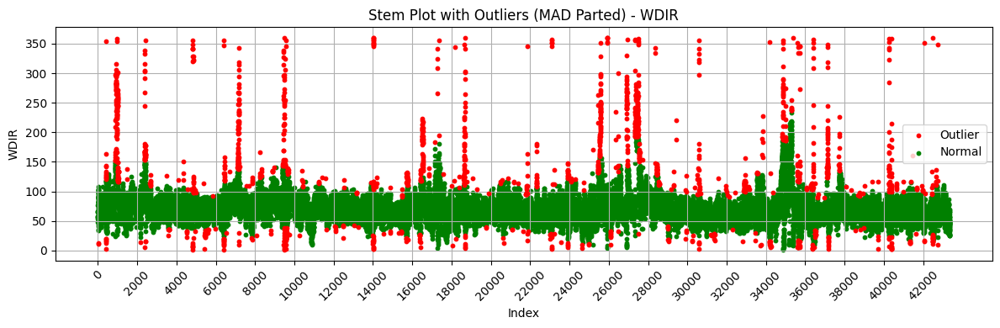

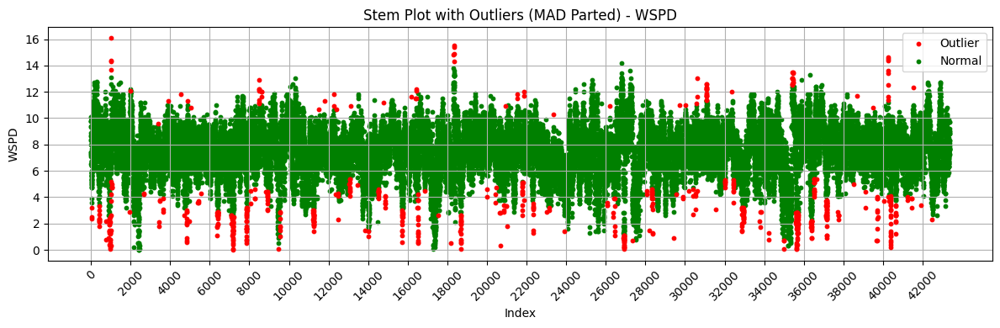

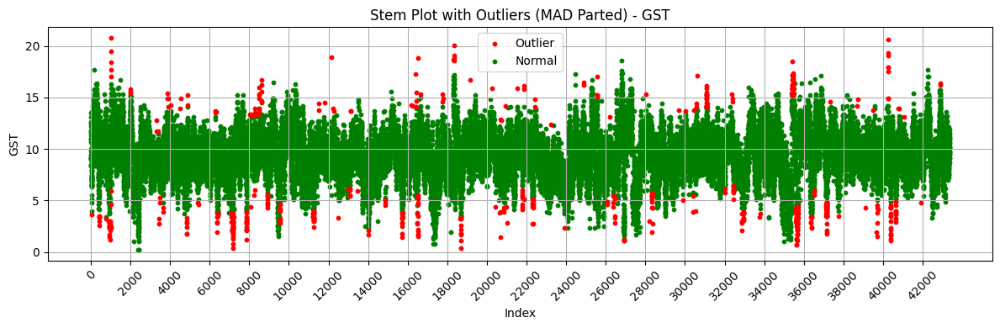

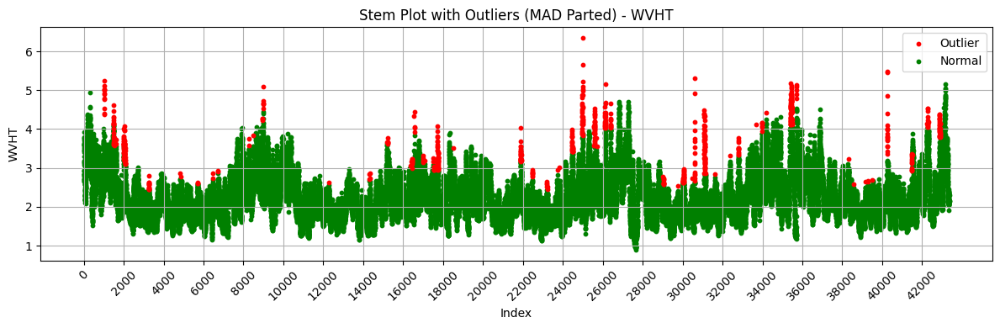

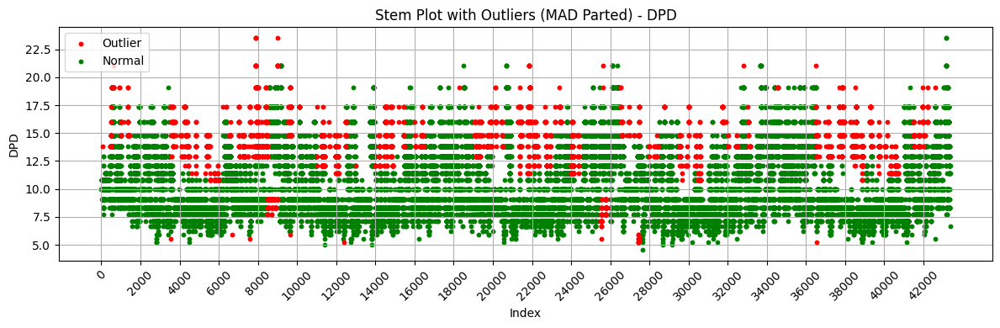

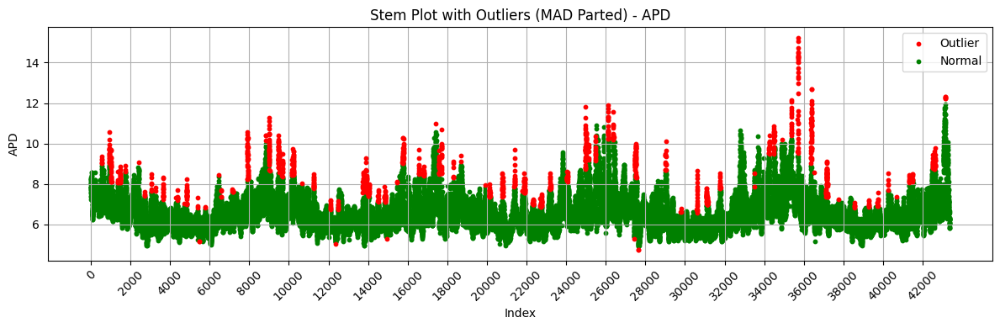

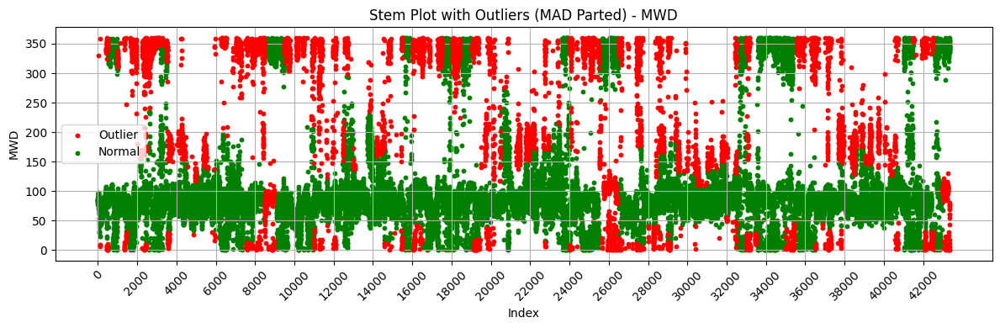

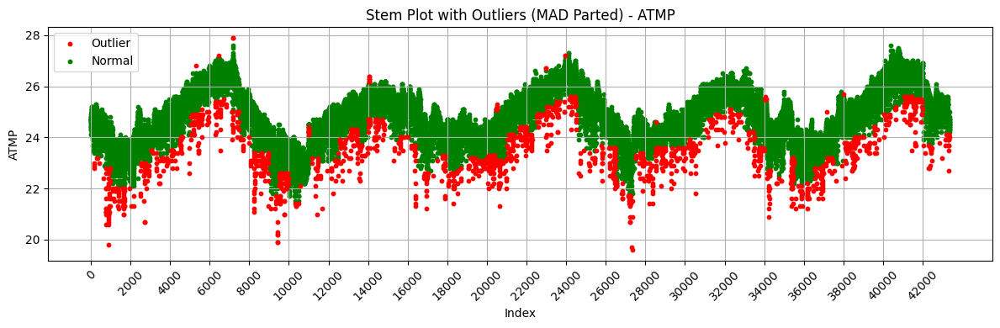

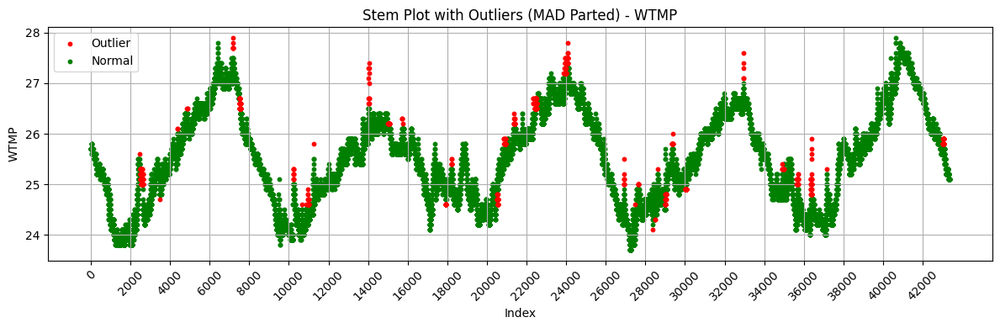

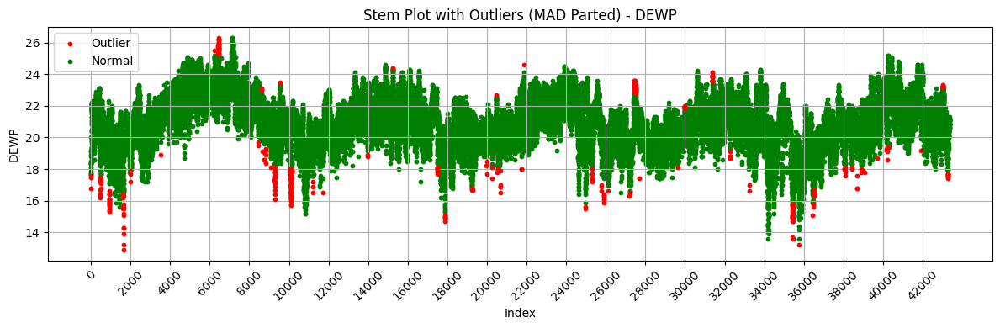

,Column,Outlier_Count
0,WDIR,1613
1,WSPD,714
2,GST,613
3,WVHT,686
4,DPD,3656
5,APD,1291
6,MWD,6749
7,ATMP,1763
8,WTMP,688
9,DEWP,380


,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
43351,False,False,False,False,False,False,True,False,False,False
43352,False,False,False,False,False,False,True,False,False,False
43353,False,False,False,False,False,False,False,False,False,False
43354,False,False,False,False,False,False,False,False,False,False


In [78]:
# Definisikan dataframe dan kolom yang ingin dicek
data = df_clean2.copy()
columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
x=500

# Deteksi outlier menggunakan metode MAD
# Gunakan fungsi yang telah didefinisikan sebelumnya
df_outliers, outliers_mask = count_outliers_mad_parted(data, x=x, columns=columns, threshold=3)
            # partisi per 500 data sebelum menghitungn batas-batas outlier

# Visualisasi outlier menggunakan fungsi visualize_outliers_parted_combined()
visualize_outliers_parted_combined(data, columns=columns, method='mad', x=x)    # metode yang digunakan adalah mad
                                                                                  # outlier dideteksi untuk tiap 500 data
display(df_outliers, outliers_mask)

In [79]:
# Copy dataframe agar mempermudah proses handling dengan cara yang berbeda
outliers_df = df_outliers.copy()
mask_outliers = outliers_mask.copy()

Kolom MWD memiliki terlalu banyak outliers sehingga akan dihapus.

### Handling (drop all outliers)

In [80]:
# Definisikan dataframe baru
outliers_mask = mask_outliers.copy()

In [81]:
# Definisikan dataframe baru dan tentukan batas total outlier (x)
x = 1
if 'MWD' in outliers_mask.columns:
    outliers_mask_ = outliers_mask.drop(columns='MWD')
else:
    outliers_mask_ = outliers_mask.copy()

df_outlier_mask = outliers_mask_[(outliers_mask_ == True).sum(axis=1) >= x ] # mengambil baris dengan total outlier >= x
print(f"Terdapat {df_outlier_mask.shape[0]} data yang memiliki >= {x} outlier.")
df_outlier_mask.sample(10)

Terdapat 8686 data yang memiliki >= 1 outlier.


,WDIR,WSPD,GST,WVHT,DPD,APD,ATMP,WTMP,DEWP
28460,True,False,False,False,False,False,False,False,False
14003,True,False,False,False,True,False,False,False,False
39490,False,True,True,False,False,False,False,False,False
22121,False,False,False,False,False,False,True,False,False
29555,False,False,False,False,True,False,False,False,False
30387,False,False,False,False,True,False,False,False,False
36301,True,False,False,False,False,False,False,False,False
37125,True,False,False,False,True,False,False,False,False
29035,False,False,False,False,False,False,False,True,False
16388,True,False,False,False,False,False,False,False,False


#### Drop semua data yang memuat outliers

In [82]:
# Definisikan list index dari df_outlier_mask2
list_index_outliers = df_outlier_mask.index.tolist()

In [83]:
# Definisikan dataframe baru dan drop baris yang memuat outlier
df_no_outliers = df_clean2.copy()
df_no_outliers = df_no_outliers.drop(index=list_index_outliers, errors='ignore')    
# mengabaikan error jika terdapat index di list_index_outliers, namun tak ada di df_no_outliers

print("Dataframe yang telah dibersihkan dari outlier:")
df_no_outliers

Dataframe yang telah dibersihkan dari outlier:


,#YY,MM,DD,hh,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,2020,1,1,0,54.0,9.8,12.2,3.53,10.00,7.40,81.0,24.8,25.7,19.1
1,2020,1,1,1,57.0,10.0,13.1,3.60,10.00,7.34,84.0,24.8,25.7,18.9
2,2020,1,1,2,58.0,8.3,10.8,3.92,10.81,7.58,84.0,24.1,25.7,18.1
3,2020,1,1,3,48.0,8.9,11.7,3.78,10.00,7.81,77.0,24.4,25.7,20.0
4,2020,1,1,4,57.0,9.8,13.5,3.44,10.81,7.23,83.0,24.5,25.7,19.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43351,2024,12,31,19,65.0,9.7,11.9,2.13,10.00,5.80,12.0,24.6,25.1,20.6
43352,2024,12,31,20,68.0,9.0,11.3,2.16,11.43,5.81,6.0,24.6,25.1,20.9
43353,2024,12,31,21,61.0,8.9,10.7,2.15,12.12,6.04,350.0,24.8,25.1,21.1
43354,2024,12,31,22,69.0,7.6,9.7,2.29,11.43,6.06,350.0,24.5,25.1,21.3


Cek kembali jumlah outlier.

,Column,Outlier_Count
0,WDIR,413
1,WSPD,264
2,GST,219
3,WVHT,380
4,DPD,1428
5,APD,584
6,MWD,4246
7,ATMP,580
8,WTMP,771
9,DEWP,110


,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
43351,False,False,False,False,False,False,False,False,False,False
43352,False,False,False,False,False,False,False,False,False,False
43353,False,False,False,False,False,False,False,False,False,False
43354,False,False,False,False,False,False,False,False,False,False


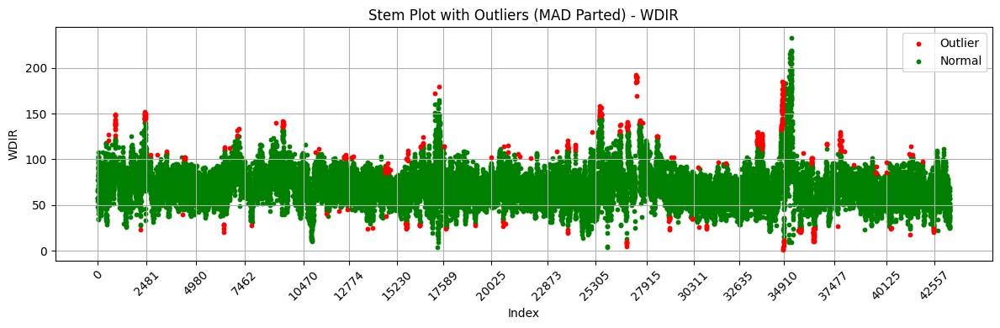

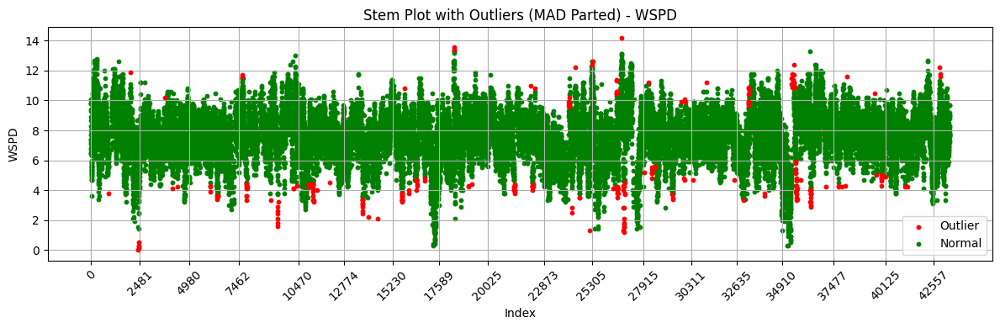

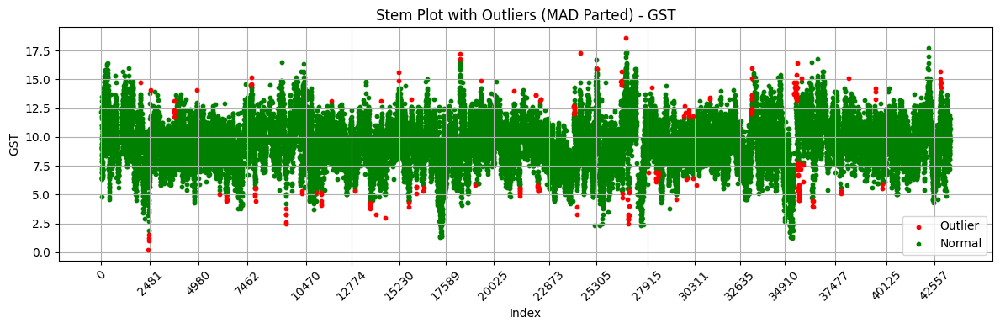

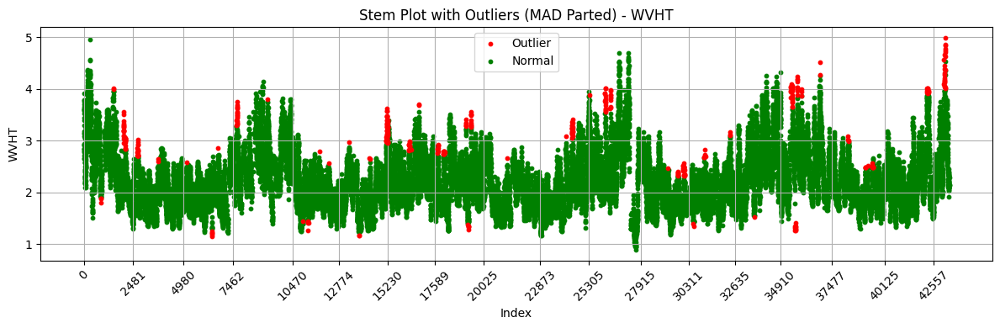

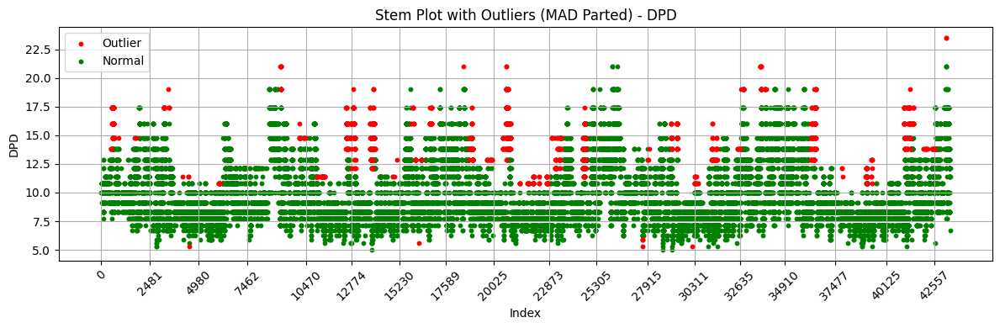

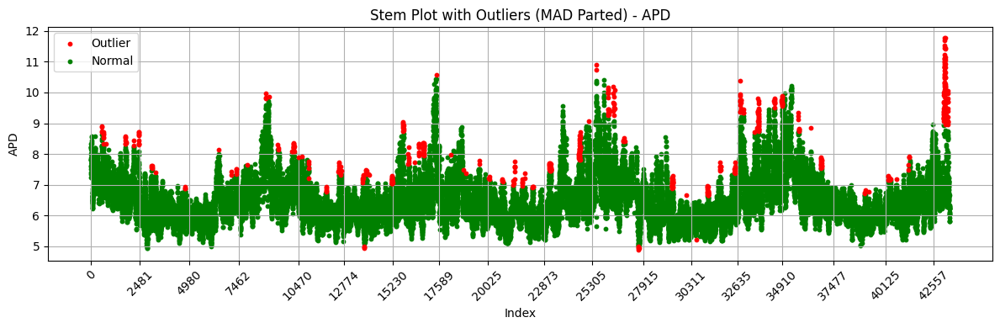

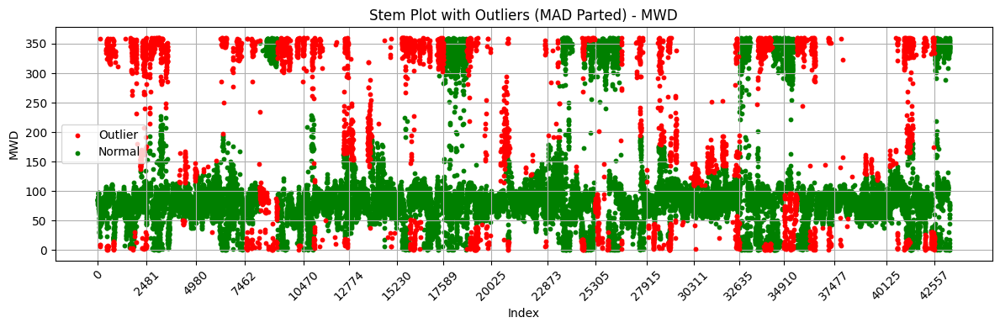

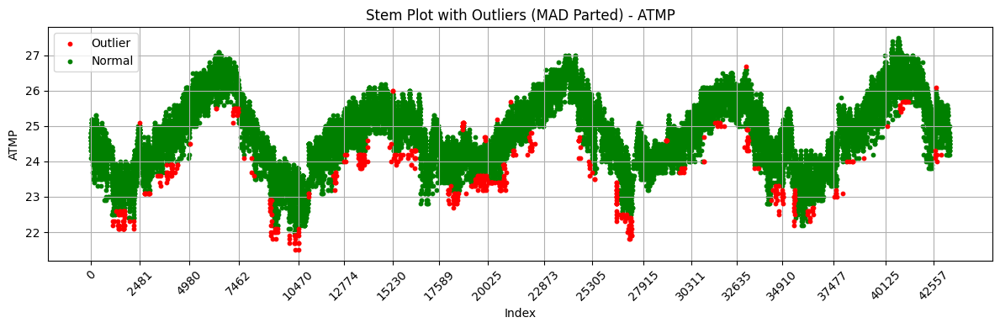

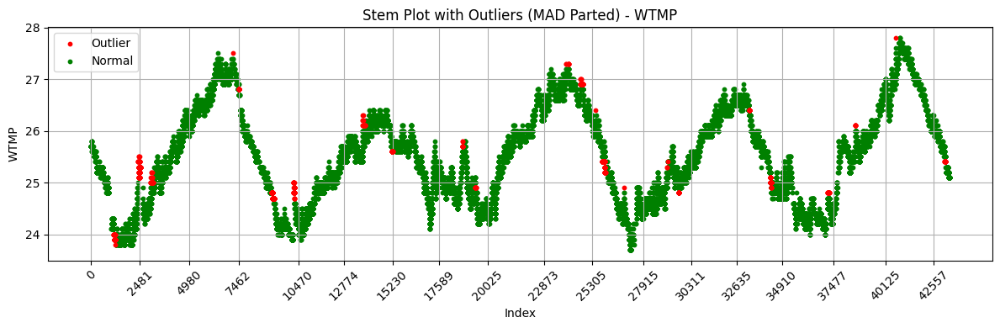

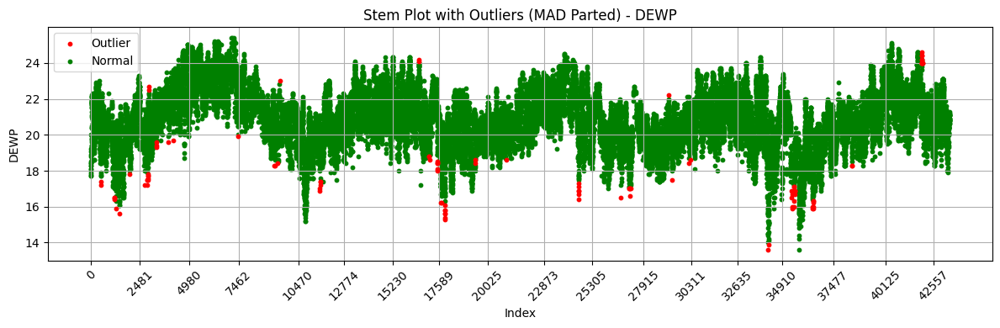

In [84]:
# Definisikan dataframe dan kolom yang ingin dicek
data = df_no_outliers.copy()
columns = ['WDIR', 'WSPD', 'GST', 'WVHT', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
x = 500 # jumlah data tiap partisi

# Deteksi outlier menggunakan metode MAD
# Gunakan fungsi yang telah didefinisikan sebelumnya
df_outliers, outliers_mask = count_outliers_mad_parted(data, x=x, columns=columns, threshold=3)
            # partisi per 500 data sebelum menghitungn batas-batas outlier

display(df_outliers, outliers_mask)

# Visualisasi outlier menggunakan fungsi visualize_outliers_parted_combined()
visualize_outliers_parted_combined(data, columns=columns, method='mad', x=x)    # metode yang digunakan adalah mad
                                                                                # outlier dideteksi untuk tiap 500 data

Definisikan dataframe yang sudah dibersihkan dari outlier.

In [85]:
# Copy dataframe
df_clean4 = df_no_outliers.copy()

# Perbarui index
df_clean4.reset_index(drop=True, inplace=True)

# Cek kembali dataframe
df_clean4

,#YY,MM,DD,hh,WDIR,WSPD,GST,WVHT,DPD,APD,MWD,ATMP,WTMP,DEWP
0,2020,1,1,0,54.0,9.8,12.2,3.53,10.00,7.40,81.0,24.8,25.7,19.1
1,2020,1,1,1,57.0,10.0,13.1,3.60,10.00,7.34,84.0,24.8,25.7,18.9
2,2020,1,1,2,58.0,8.3,10.8,3.92,10.81,7.58,84.0,24.1,25.7,18.1
3,2020,1,1,3,48.0,8.9,11.7,3.78,10.00,7.81,77.0,24.4,25.7,20.0
4,2020,1,1,4,57.0,9.8,13.5,3.44,10.81,7.23,83.0,24.5,25.7,19.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34665,2024,12,31,19,65.0,9.7,11.9,2.13,10.00,5.80,12.0,24.6,25.1,20.6
34666,2024,12,31,20,68.0,9.0,11.3,2.16,11.43,5.81,6.0,24.6,25.1,20.9
34667,2024,12,31,21,61.0,8.9,10.7,2.15,12.12,6.04,350.0,24.8,25.1,21.1
34668,2024,12,31,22,69.0,7.6,9.7,2.29,11.43,6.06,350.0,24.5,25.1,21.3


## Data Transformation

In [86]:
# tentukan dataframe yang ingin digunakan
#df_clean5 = df_clean3 # outlier yang dihapus tidak semua
df_clean5 = df_clean4 # outlier yang dihapus semua

### Wind Speed Transformation

In [87]:
# Copy dataframe (pastikan dataframe yang di-copy adalah dataframe terakhir sebelum ini)
data = df_clean5.copy()

# Parameter
k   = 0.4               # von Kármán constant
Cd  = 1.2 * 10**(-3)    # drag coefficient
z0 = 9.7 * 10**(-5)     # roughness length
z   = 4.1               # anemometer height

# Nilai asli WSPD pada dataset (kecepatan angin sebenarnya di ketinggian z (4.1m))
Uz = data['WSPD']      

# Hitung nilai WSPD di ketinggian 10 m
data['WSPD_10m'] = Uz * ((k**2/Cd)**(1/2)) * (1/np.log(z/z0))

# Definisikan kembali dataframe baru
df_transformed_wspd = data.copy()

In [88]:
df_transformed_wspd.describe().T

,count,mean,std,min,25%,50%,75%,max
#YY,34670.0,2022.028180,1.408117,2020.000000,2021.00000,2022.000000,2023.000000,2024.000000
MM,34670.0,6.535939,3.455359,1.000000,4.00000,7.000000,10.000000,12.000000
DD,34670.0,15.752408,8.825208,1.000000,8.00000,16.000000,23.000000,31.000000
hh,34670.0,11.452437,6.910497,0.000000,5.00000,11.000000,17.000000,23.000000
WDIR,34670.0,69.904047,18.803722,1.000000,59.00000,68.000000,79.000000,233.000000
WSPD,34670.0,7.612284,1.640552,0.000000,6.60000,7.700000,8.700000,14.200000
GST,34670.0,9.511197,2.012698,0.200000,8.20000,9.500000,10.800000,18.600000
WVHT,34670.0,2.242903,0.530278,0.890000,1.86000,2.160000,2.530000,4.990000
DPD,34670.0,9.850316,2.545587,5.000000,8.33000,9.090000,10.810000,23.530000
APD,34670.0,6.514451,0.779246,4.880000,5.98000,6.360000,6.870000,11.780000


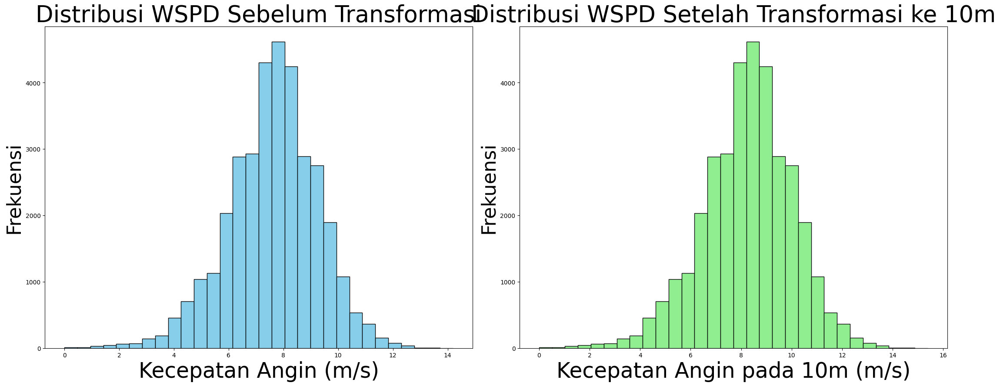

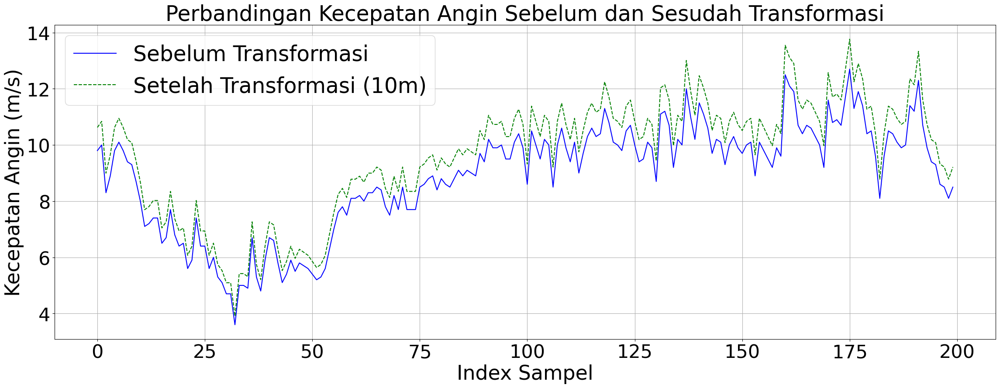

In [166]:
# Ambil nilai mentah
data1 = df_transformed_wspd['WSPD']
data2 = df_transformed_wspd['WSPD_10m']

# ----------------------
# 1. Histogram (Distribusi)
# ----------------------
plt.figure(figsize=(22, 9))

# Histogram sebelum transformasi
plt.subplot(1, 2, 1)
plt.hist(data1, bins=30, color='skyblue', edgecolor='black')
plt.title('Distribusi WSPD Sebelum Transformasi', fontsize=38)
plt.xlabel('Kecepatan Angin (m/s)', fontsize=35)
plt.ylabel('Frekuensi', fontsize=32)

# Histogram sesudah transformasi
plt.subplot(1, 2, 2)
plt.hist(data2, bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribusi WSPD Setelah Transformasi ke 10m', fontsize=38)
plt.xlabel('Kecepatan Angin pada 10m (m/s)', fontsize=35)
plt.ylabel('Frekuensi', fontsize=32)

plt.tight_layout()
plt.show()

# ----------------------
# 2. Line Plot (perubahan nilai)
# ----------------------
plt.figure(figsize=(23, 9))
sample_n = 200  # Ambil 200 sampel pertama untuk visualisasi
plt.plot(data1[:sample_n].values, label='Sebelum Transformasi', color='blue')
plt.plot(data2[:sample_n].values, label='Setelah Transformasi (10m)', color='green', linestyle='--')
plt.title('Perbandingan Kecepatan Angin Sebelum dan Sesudah Transformasi', fontsize=35)
plt.xlabel('Index Sampel', fontsize=33)
plt.ylabel('Kecepatan Angin (m/s)', fontsize=33)
plt.tick_params(axis='x', labelsize=31)
plt.tick_params(axis='y', labelsize=31)
plt.legend(fontsize=35)
plt.grid(True)
plt.tight_layout()
plt.show()

### Box Cox Transformation for Skewed Data

Cek distribusi data.

In [90]:
df_transformed_wspd.describe().T

,count,mean,std,min,25%,50%,75%,max
#YY,34670.0,2022.028180,1.408117,2020.000000,2021.00000,2022.000000,2023.000000,2024.000000
MM,34670.0,6.535939,3.455359,1.000000,4.00000,7.000000,10.000000,12.000000
DD,34670.0,15.752408,8.825208,1.000000,8.00000,16.000000,23.000000,31.000000
hh,34670.0,11.452437,6.910497,0.000000,5.00000,11.000000,17.000000,23.000000
WDIR,34670.0,69.904047,18.803722,1.000000,59.00000,68.000000,79.000000,233.000000
WSPD,34670.0,7.612284,1.640552,0.000000,6.60000,7.700000,8.700000,14.200000
GST,34670.0,9.511197,2.012698,0.200000,8.20000,9.500000,10.800000,18.600000
WVHT,34670.0,2.242903,0.530278,0.890000,1.86000,2.160000,2.530000,4.990000
DPD,34670.0,9.850316,2.545587,5.000000,8.33000,9.090000,10.810000,23.530000
APD,34670.0,6.514451,0.779246,4.880000,5.98000,6.360000,6.870000,11.780000


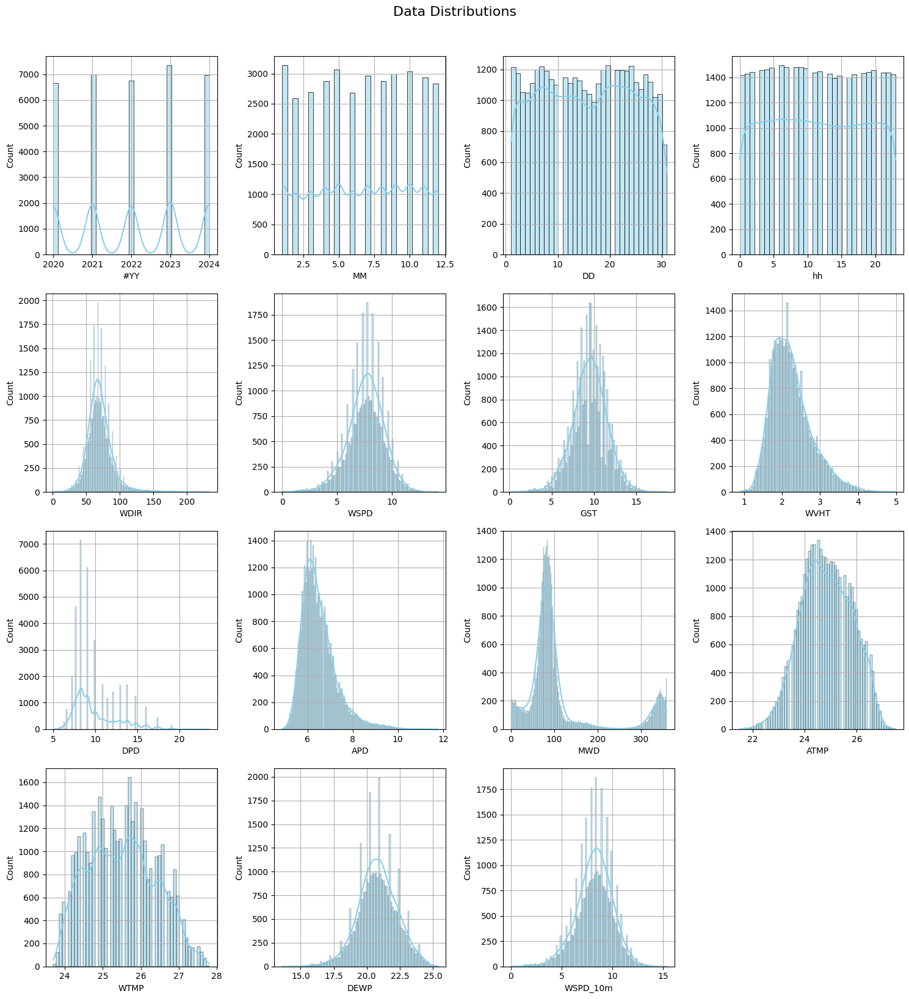

In [91]:
# Gunakan fungsi data_histogram()
data_histogram(df_transformed_wspd)

Dari visualisasi di atas terlihat jelas bahwa beberapa data memiliki distribusi yang skewed dan tidak berdistribusi normal.
Seperti WDIR, WVHT, DPD, APD, MWD, ATMP, dan WTMP. DEWP juga terlihat sedikit skewed ke kiri.

Data yang skewed dapat mempengeruhi kinerja model dalam memprediksi. Sehingga, perlu dilakukan transformasi data untuk mempersiapkan data agar model yang dilatih dapat memiliki kinerja yang baik.
Sebagaimana jurnal https://www.frontiersin.org/journals/artificial-intelligence/articles/10.3389/frai.2022.877569/full, Box Cox transformation dapat meningkatkan akurasi prediksi 12%. Sehingga, dalam proyek ini akan digunakan Box Cox transformation.

Sebagai pengingat, karena kolom target adalah WVHT. Setelah dilakukan prediksi, WAJIB mengembalikan nilai prediksi ke skala asli menggunakan fungsi inverse yang sudah didefinisikan.

In [92]:
# Cek nilai skewness sebelum ditransformasi
data = df_transformed_wspd.copy()
cols = ['WDIR', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
var_skewness(data, cols)

,Kolom,Skewness
0,WDIR,1.417069
1,DPD,1.194198
2,APD,1.436398
3,MWD,1.702188
4,ATMP,-0.056613
5,WTMP,0.158464
6,DEWP,-0.168555


In [93]:
g1_WDIR = hitung_skewness_fisher(data['WDIR'])
print("Skewness G1 WDIR:", g1_WDIR)
g1_DPD = hitung_skewness_fisher(data['DPD'])
print("Skewness G1 WDIR:", g1_DPD)


Skewness G1 WDIR: 1.417130711717602
Skewness G1 WDIR: 1.1942494378126338


In [94]:
# Definisikan dataframe dan list kolom yang ingin ditransformasi
data = df_transformed_wspd.copy()
cols = ['WDIR', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']

# Gunakan fungsi transform_data_boxcox(df, columns) yang sudah didefinisikan sebelumnya
df_transformed_boxcox, lambdas = transform_data_boxcox(data, columns=cols)
print(lambdas)

✅ Kolom "WDIR" ditransformasi dengan Box-Cox. Skewness baru: 0.11
✅ Kolom "DPD" ditransformasi dengan Box-Cox. Skewness baru: 0.06
✅ Kolom "APD" ditransformasi dengan Box-Cox. Skewness baru: 0.02
✅ Kolom "MWD" ditransformasi dengan Box-Cox. Skewness baru: 0.11
✅ Kolom "ATMP" ditransformasi dengan Box-Cox. Skewness baru: -0.01
✅ Kolom "WTMP" ditransformasi dengan Box-Cox. Skewness baru: 0.01
✅ Kolom "DEWP" ditransformasi dengan Box-Cox. Skewness baru: 0.01
{'WDIR': 0.34717799065474625, 'DPD': -1.347496322357039, 'APD': -2.69711109949372, 'MWD': 0.24251398734225255, 'ATMP': 1.5320059401762438, 'WTMP': -1.4111973464201137, 'DEWP': 1.713042435388357}


In [95]:
# Cek nilai skewness setelah ditransformasi
data = df_transformed_boxcox.copy()
cols = ['WDIR', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
var_skewness(data, cols)

,Kolom,Skewness
0,WDIR,0.109661
1,DPD,0.064430
2,APD,0.021284
3,MWD,0.110929
4,ATMP,-0.010990
5,WTMP,0.014240
6,DEWP,0.011193


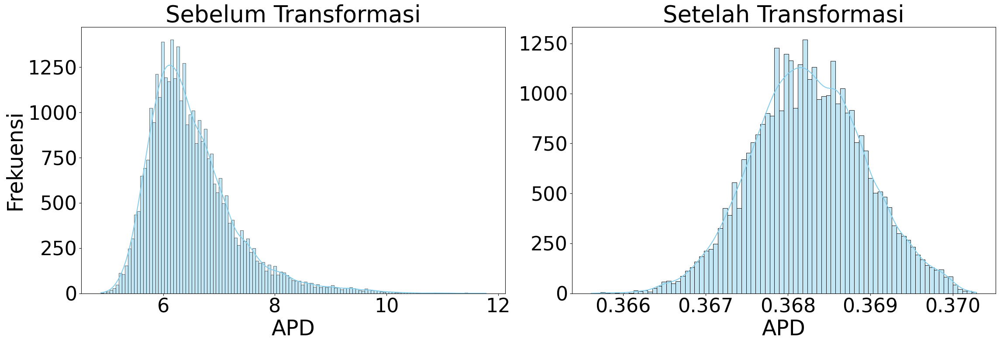

In [164]:
cols = ['APD']
data1 = df_transformed_wspd[cols].copy()
data2 = df_transformed_boxcox[cols].copy()

# Setup ukuran figure dan dua subplot horizontal
fig, axes = plt.subplots(1, 2, figsize=(23, 8))

# Plot histogram untuk data sebelum transformasi
sns.histplot(data1['APD'], kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Sebelum Transformasi', fontsize=38)
axes[0].set_xlabel('APD', fontsize=35)
axes[0].set_ylabel('Frekuensi', fontsize=35)
axes[0].tick_params(axis='x', labelsize=32)
axes[0].tick_params(axis='y', labelsize=32)

# Plot histogram untuk data setelah transformasi
sns.histplot(data2['APD'], kde=True, ax=axes[1], color='skyblue')
axes[1].set_title('Setelah Transformasi', fontsize=38)
axes[1].set_xlabel('APD', fontsize=35)
axes[1].set_ylabel(None)
axes[1].tick_params(axis='x', labelsize=32)
axes[1].tick_params(axis='y', labelsize=32)

# Tata letak agar tidak saling tumpang tindih
plt.tight_layout()
plt.show()

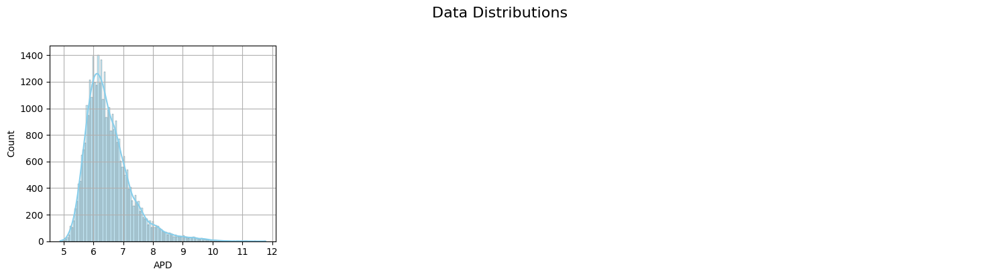

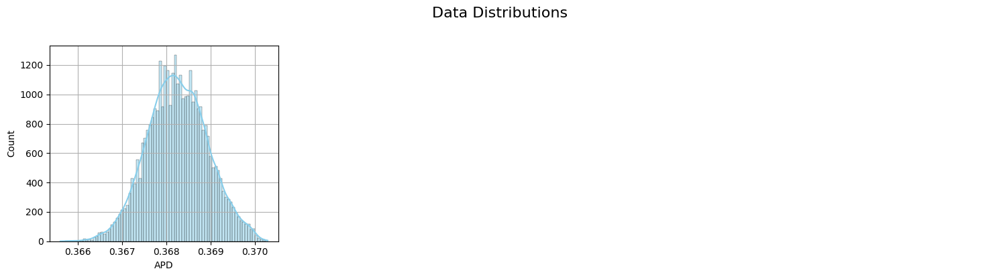

In [97]:
# cols = ['WDIR', 'DPD', 'APD', 'MWD', 'ATMP', 'WTMP', 'DEWP']
cols = ['APD']
data1 = df_transformed_wspd[cols].copy()
data2 = df_transformed_boxcox[cols].copy()

data_histogram(data1)
data_histogram(data2)

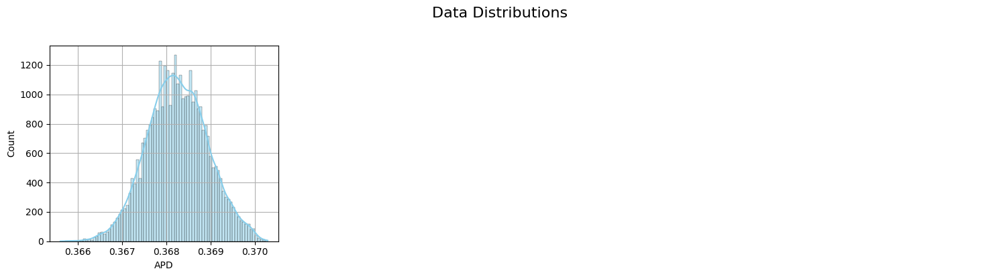

In [98]:
data_histogram(data2)

Pisahkan transformasi kolom target--WVHT, sendiri agar nanti mudah diaplikasikan fungsi inverse.

In [99]:
# Definisikan dataframe dan list kolom yang ingin ditransformasi
data = df_transformed_boxcox.copy()
cols = ['WVHT']

# Gunakan fungsi transform_data_boxcox(df, columns) yang sudah didefinisikan sebelumnya
WVHT_transformed_boxcox, wvht_lambdas = transform_data_boxcox(data, columns=cols)

✅ Kolom "WVHT" ditransformasi dengan Box-Cox. Skewness baru: 0.00


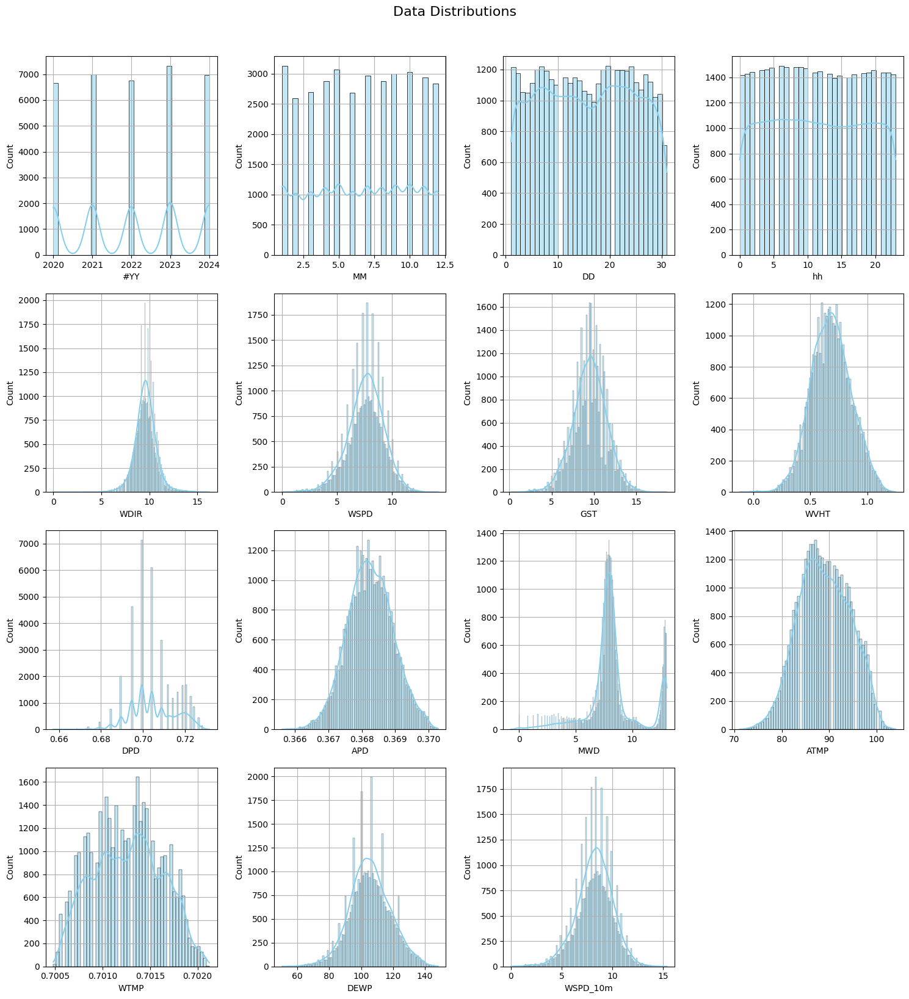

In [100]:
# Cek kembali distribusi data
data_histogram(WVHT_transformed_boxcox)

In [101]:
# Tidak termasuk transformasi Box-Cox
df_clean6 = df_transformed_wspd.copy()

In [102]:
# WVHT tidak di transformasi
df_clean7 = df_transformed_boxcox.copy()

In [103]:
# WVHT juga di transformasi
df_clean8 = WVHT_transformed_boxcox.copy()

# Feature Selection

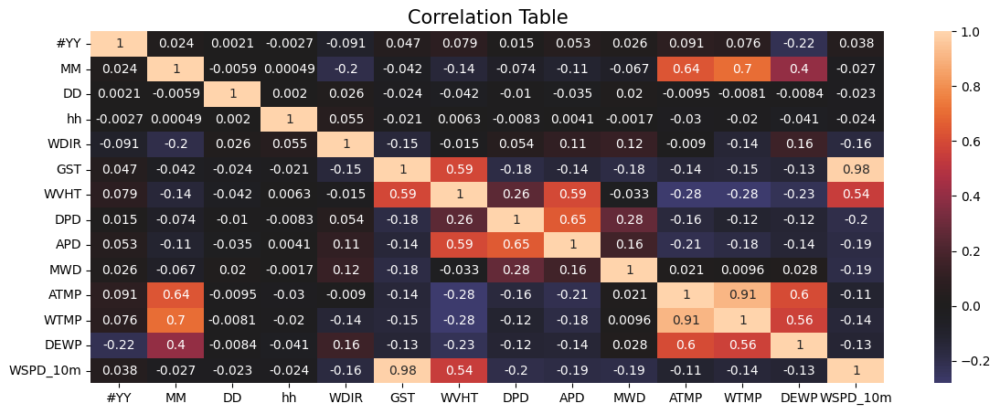

In [104]:
df_final_corr = df_clean7.corr().drop(index="WSPD", columns="WSPD")

plt.figure(figsize=(14,5))
sns.heatmap(df_final_corr, annot=True, center=0)
plt.title("Correlation Table", fontsize=15)
plt.show()

In [105]:
df_target_corr = df_clean7.corr()['WVHT'].sort_values(ascending=False)
print(df_target_corr)

WVHT        1.000000
APD         0.594349
GST         0.585329
WSPD        0.544564
WSPD_10m    0.544564
DPD         0.258118
#YY         0.078954
hh          0.006253
WDIR       -0.014542
MWD        -0.033187
DD         -0.041882
MM         -0.137212
DEWP       -0.226300
ATMP       -0.278357
WTMP       -0.282117
Name: WVHT, dtype: float64


Dari correlation table di atas, terdapat beberapa variable yang memiliki skor korelasi sangat rendah dengan WVHT, yaitu hh, DD, WDIR, dan MWD. Fitur-fitur ini tidak memberikan dampak signifikan dalam proses prediksi, sehingga dapat disingkirkan (akan dilakukan percobaan terlebih dahulu) untuk data latih dan data uji. #YY juga memiliki skor korelasi yang cukup kecil, namun diperlukan untuk membagi data tes dan data uji. Karenanya, #YY akan disimpan untuk df_final, namun akan dihapus setelah membagi data latih dan data uji.

Sementara itu, WSPD akan dihapus di df_final karena telah diwakilkan dengan WSPD_10m, yaitu WSPD di ketinggian 10m.

In [106]:
# Definisikan dataframe final yang akan digunakan untuk melatih dan menguji model dalam proses prediksi
df_final = df_clean7.copy().drop(columns=['hh', 'WSPD', 'MWD'])
    # df_clean5 adalah dataframe yang telah melalui transformasi boxcox untuk beberapa variabel (tidak termasuk WVHT)
    # df_clean5 dipilih dari skor metrik evaluasi setelah melalui uji coba pelatihan dan pengujian model

# Data Train & Data Test

Karena data merupakan data time series, data latih dan data uji dibagi berdasarkan waktu (tahun).

Data latih: 
- data yang digunakan untuk melatih model.
- data tahun 2019-2023

Data uji: 
- data yang digunakan untuk menguji model, yaitu melakukan prediksi data dependen (target/y) berdasarkan data independen (X).
- data tahun 2024

In [107]:
# Split berdasarkan nilai tahun
data = df_final.copy()
df_train = data[data['#YY'] < 2024].copy()
df_test = data[data['#YY'] == 2024].copy()

# Drop kolom tahun
train_df = df_train.copy().drop(columns=['#YY'])
test_df = df_test.copy().drop(columns=['#YY'])

Kolom #YY dihapus karena hanya memiliki satu nilai di data uji, yaitu 2024.

In [108]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MM,27707.0,6.520699,3.441443,1.000000,4.000000,7.000000,10.000000,12.000000
DD,27707.0,15.723572,8.770373,1.000000,8.000000,16.000000,23.000000,31.000000
WDIR,27707.0,9.633263,1.072883,1.780533,9.053544,9.646883,10.249556,14.991081
GST,27707.0,9.442690,1.982242,0.200000,8.200000,9.500000,10.700000,18.600000
WVHT,27707.0,2.214533,0.521836,0.890000,1.840000,2.130000,2.500000,4.950000
DPD,27707.0,0.705113,0.010676,0.657275,0.699468,0.704202,0.714271,0.729888
APD,27707.0,0.368233,0.000682,0.365611,0.367773,0.368222,0.368709,0.370175
ATMP,27707.0,88.641371,5.159303,71.133828,84.853513,88.687644,92.579789,101.689995
WTMP,27707.0,0.701252,0.000344,0.700483,0.700987,0.701241,0.701518,0.702023
DEWP,27707.0,106.128882,12.786638,50.470520,97.415395,105.129707,114.886340,148.274062


In [109]:
test_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MM,6963.0,6.596582,3.509780,1.000000,4.000000,7.000000,10.000000,12.000000
DD,6963.0,15.867155,9.039844,1.000000,8.000000,16.000000,24.000000,31.000000
WDIR,6963.0,9.495468,1.385429,0.000000,8.771090,9.389827,10.074260,16.233198
GST,6963.0,9.783800,2.107780,1.200000,8.600000,9.800000,11.200000,17.700000
WVHT,6963.0,2.355789,0.548301,1.260000,1.950000,2.260000,2.640000,4.990000
DPD,6963.0,0.704566,0.010665,0.662877,0.699468,0.704202,0.712098,0.731592
APD,6963.0,0.368343,0.000675,0.366015,0.367879,0.368296,0.368765,0.370288
ATMP,6963.0,90.118093,5.973546,74.745344,85.397665,89.793799,94.829630,104.013300
WTMP,6963.0,0.701340,0.000414,0.700626,0.700944,0.701362,0.701669,0.702123
DEWP,6963.0,104.009549,13.368665,50.470520,95.734243,104.260567,112.189931,145.274950


## Dependent and Independent Variables

In [110]:
# Menetapkan kolom target (dependen)
target_col = 'WVHT'  # dapat diganti sesuai target

# Definisikan kolom dependen dan independen data latih
X_train = train_df.drop(columns=[target_col])
y_train = train_df[target_col]

# Definisikan kolom dependen dan independen data uji
X_test = test_df.drop(columns=[target_col])
y_test = test_df[target_col]

In [111]:
X_train

,MM,DD,WDIR,GST,DPD,APD,ATMP,WTMP,DEWP,WSPD_10m
0,1,1,8.624903,12.2,0.708776,0.369089,88.687644,0.701362,90.763687,10.623631
1,1,1,8.842907,13.1,0.708776,0.369052,88.687644,0.701362,89.131255,10.840440
2,1,1,8.913907,10.8,0.712098,0.369195,84.853513,0.701362,82.724615,8.997565
3,1,1,8.163922,11.7,0.708776,0.369317,86.489559,0.701362,98.260507,9.647992
4,1,1,8.842907,13.5,0.712098,0.368981,87.037296,0.701362,91.584493,10.623631
...,...,...,...,...,...,...,...,...,...,...
27702,12,31,10.532303,8.4,0.718460,0.369020,86.489559,0.700987,86.705626,6.937882
27703,12,31,9.771772,8.0,0.718460,0.369071,86.489559,0.700987,89.945939,6.937882
27704,12,31,9.709619,7.5,0.718460,0.369255,86.489559,0.701031,88.319638,6.612668
27705,12,31,9.323958,8.1,0.718460,0.369296,87.037296,0.701031,87.511094,6.612668


# Model Training and Testing

In [112]:
# Random Forest Regressor 

# Hyperparameter space
rf_bayes_params = {
    'n_estimators': (100, 1000),
    'max_depth': (3, 30),
    'min_samples_split': (2, 20),
    'min_samples_leaf': (1, 20),
    'max_features': ('sqrt', 'log2', None)  # numerik: rasio fitur (contoh: 0.3 artinya 30% dari semua fitur)
}

# Setup BayesSearchCV
rf_bayes_search = BayesSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    search_spaces=rf_bayes_params,
    n_iter=25,                     # jumlah percobaan kombinasi parameter
    cv=5,                          # 5-fold cross-validation
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose=3,
    random_state=42
)

# Training dan mencari parameter terbaik
rf_bayes_search.fit(X_train, y_train)
rf_best = rf_bayes_search.best_estimator_

# Tampilkan hasil terbaik
print("Best Params:", rf_bayes_search.best_params_)
print("Best RMSE:", -rf_bayes_search.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

In [113]:
# Gradient Boosting 

# Definisi ruang pencarian parameter
gb_bayes_params = {
    'n_estimators': (100, 1000),
    'learning_rate': (0.001, 0.3),
    'max_depth': (3, 30),
    'subsample': (0.5, 1.0),
    'min_samples_split': (2, 20),
    'min_samples_leaf': (1, 20)
}

# Setup BayesSearchCV
gb_bayes_search = BayesSearchCV(
    estimator=GradientBoostingRegressor(loss='squared_error', random_state=42),
    search_spaces=gb_bayes_params,
    n_iter=25,  # jumlah iterasi pencarian (boleh ditambah untuk pencarian lebih akurat)
    scoring='neg_root_mean_squared_error',
    cv=5,
    n_jobs=-1,
    verbose=3,
    random_state=42
)

# Training dan mencari parameter terbaik
gb_bayes_search.fit(X_train, y_train)
gb_best = gb_bayes_search.best_estimator_

# Menampilkan hasil terbaik
print("Best params :", gb_bayes_search.best_params_)
print("Best RMSE   :", -gb_bayes_search.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

In [114]:
# Prediksi nilai wave height (y = 'WVHT')
y_pred_rf = rf_best.predict(X_test)
y_pred_gb = gb_best.predict(X_test)

# Model Evaluation

In [140]:
# Evaluasi tiap model menggunakan fungsi evaluate_model(y_true, y_pred, model_name)
results = [
    evaluate_model(y_test, y_pred_rf, "Random Forest"),
    evaluate_model(y_test, y_pred_gb, "Gradient Boosting")
]

# Buat hasil evaluasi dalam dataframe
metric_eval_df = pd.DataFrame(results).sort_values(by='RMSE')
metric_eval_df


📊 Evaluasi Model: Random Forest
MAE   : 0.15396
RMSE  : 0.21762
R²    : 0.84244
Bias  : -0.00475
Pearson Correlation (r): 0.91811

📊 Evaluasi Model: Gradient Boosting
MAE   : 0.15227
RMSE  : 0.20845
R²    : 0.85544
Bias  : -0.00844
Pearson Correlation (r): 0.92516


,Model,MAE,RMSE,R2,Bias,Pearson_r
1,Gradient Boosting,0.152266,0.208453,0.855442,-0.00844,0.92516
0,Random Forest,0.153958,0.217625,0.842442,-0.00475,0.91811


# Visualization

## Error Distribution

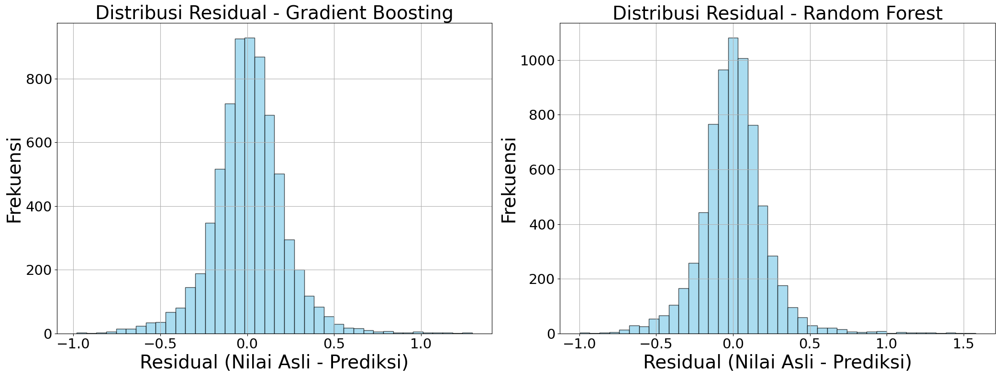

In [147]:
# Hitung residual (selisih antara nilai aktual dan prediksi)
residual_gb = y_test - y_pred_gb
residual_rf = y_test - y_pred_rf

# Buat figure dan dua subplot horizontal
plt.figure(figsize=(21, 8))

# Histogram Gradient Boosting
plt.subplot(1, 2, 1)
plt.hist(residual_gb, bins=40, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribusi Residual - Gradient Boosting', fontsize=28)
plt.xlabel('Residual (Nilai Asli - Prediksi)', fontsize=28)
plt.ylabel('Frekuensi', fontsize=28)
plt.grid(True)
plt.tick_params(axis='x', labelsize=21)
plt.tick_params(axis='y', labelsize=21)

# Histogram Random Forest
plt.subplot(1, 2, 2)
plt.hist(residual_rf, bins=40, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribusi Residual - Random Forest', fontsize=28)
plt.xlabel('Residual (Nilai Asli - Prediksi)', fontsize=28)
plt.ylabel('Frekuensi', fontsize=28)
plt.grid(True)
plt.tick_params(axis='x', labelsize=21)
plt.tick_params(axis='y', labelsize=21)

# Tata letak
plt.tight_layout()
plt.show()


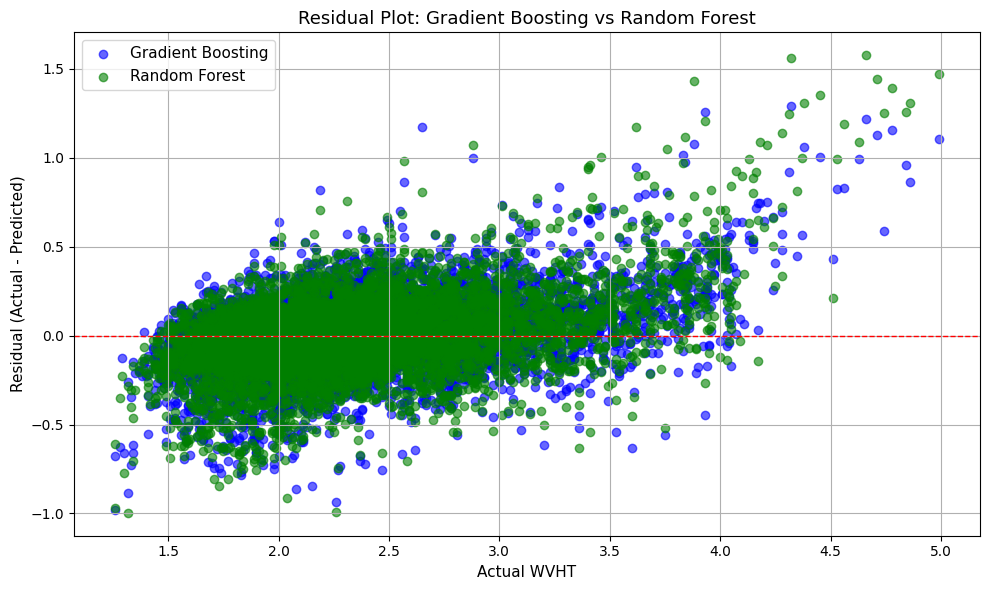

In [117]:
# Hitung residual (error)
residual_gb = y_test - y_pred_gb
residual_rf = y_test - y_pred_rf

# Plot
plt.figure(figsize=(10, 6))

# Gradient Boosting
plt.scatter(y_test, residual_gb, color='blue', alpha=0.6, label='Gradient Boosting')
# Random Forest
plt.scatter(y_test, residual_rf, color='green', alpha=0.6, label='Random Forest')

# Garis nol
plt.axhline(y=0, color='red', linestyle='--', linewidth=1)

# Label dan judul
plt.xlabel('Actual WVHT', fontsize=11)
plt.ylabel('Residual (Actual - Predicted)', fontsize=11)
plt.title('Residual Plot: Gradient Boosting vs Random Forest', fontsize=13)
plt.legend(fontsize=11)
plt.grid(True)
plt.tight_layout()
plt.show()

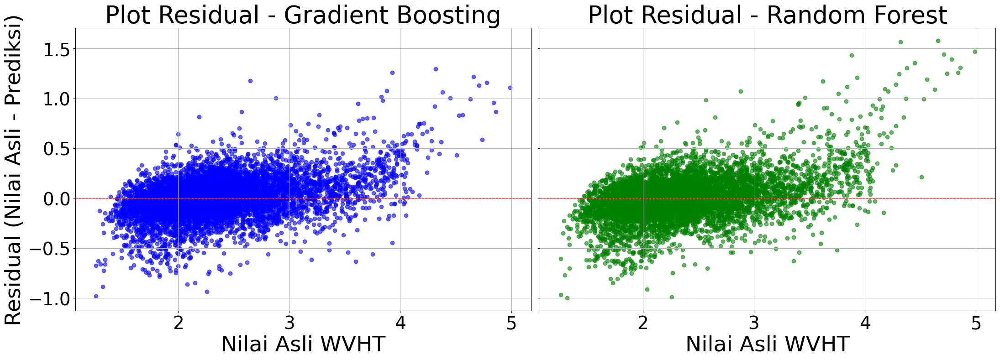

In [159]:
# Hitung residual
residual_gb = y_test - y_pred_gb
residual_rf = y_test - y_pred_rf

# Buat subplot 1x2
fig, axes = plt.subplots(1, 2, figsize=(22, 8), sharey=True)

# --- Gradient Boosting ---
axes[0].scatter(y_test, residual_gb, color='blue', alpha=0.6)
axes[0].axhline(y=0, color='red', linestyle='--', linewidth=1)
axes[0].set_title('Plot Residual - Gradient Boosting', fontsize=38)
axes[0].set_xlabel('Nilai Asli WVHT', fontsize=34)
axes[0].set_ylabel('Residual (Nilai Asli - Prediksi)', fontsize=34)
axes[0].grid(True)
axes[0].tick_params(axis='x', labelsize=28)
axes[0].tick_params(axis='y', labelsize=28)

# --- Random Forest ---
axes[1].scatter(y_test, residual_rf, color='green', alpha=0.6)
axes[1].axhline(y=0, color='red', linestyle='--', linewidth=1)
axes[1].set_title('Plot Residual - Random Forest', fontsize=38)
axes[1].set_xlabel('Nilai Asli WVHT', fontsize=34)
axes[1].grid(True)
axes[1].tick_params(axis='x', labelsize=28)
axes[1].tick_params(axis='y', labelsize=28)

plt.tight_layout()
plt.show()

## Actual vs Predicted WVHT

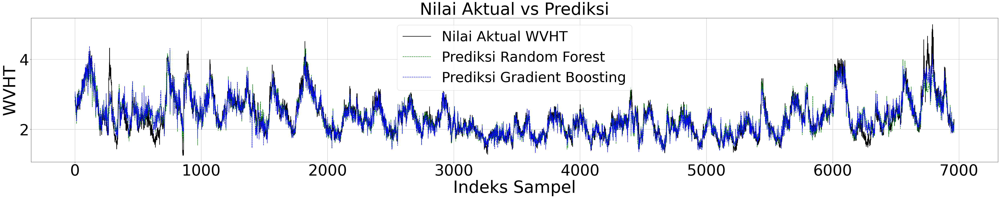

In [156]:
# Konversi y_test ke numpy array jika y_test sebuah series
actual = np.array(y_test)   # membantu antisipasi jika y_test berubah selama proses sebelumnya

# Plot prediksi vs nilai asli
plt.figure(figsize=(50, 10))
plt.plot(actual, label='Nilai Aktual WVHT', color='black', linewidth=2)
plt.plot(y_pred_rf, label='Prediksi Random Forest', linestyle='--', color='green')
plt.plot(y_pred_gb, label='Prediksi Gradient Boosting', linestyle='--', color='blue')

plt.title('Nilai Aktual vs Prediksi', fontsize=60)
plt.xlabel('Indeks Sampel', fontsize=60)
plt.ylabel('WVHT', fontsize=60)
plt.tick_params(axis='x', labelsize=55)
plt.tick_params(axis='y', labelsize=55)
plt.legend(fontsize=50)
plt.grid(True)
plt.tight_layout()
plt.show()

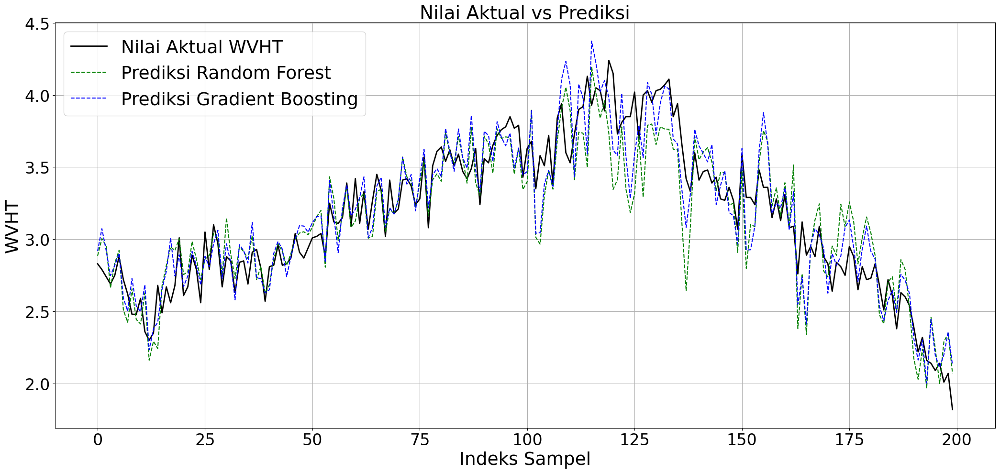

In [149]:
# Konversi y_test ke numpy array jika y_test sebuah series
actual = np.array(y_test)   # membantu antisipasi jika y_test berubah selama proses sebelumnya

# Mengambil sampel data untuk visualisasi
n_points = 200  # Sesuaikan angka untuk range sampel yang lebih besar atau kecil
indices = np.arange(len(actual))[:n_points]

# Plot prediksi vs nilai asli
plt.figure(figsize=(21, 10))
plt.plot(indices, actual[:n_points], label='Nilai Aktual WVHT', color='black', linewidth=2)
plt.plot(indices, y_pred_rf[:n_points], label='Prediksi Random Forest', linestyle='--', color='green')
plt.plot(indices, y_pred_gb[:n_points], label='Prediksi Gradient Boosting', linestyle='--', color='blue')

plt.title('Nilai Aktual vs Prediksi', fontsize=28)
plt.xlabel('Indeks Sampel', fontsize=27)
plt.ylabel('WVHT', fontsize=27)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.legend(fontsize=27)
plt.grid(True)
plt.tight_layout()
plt.show()

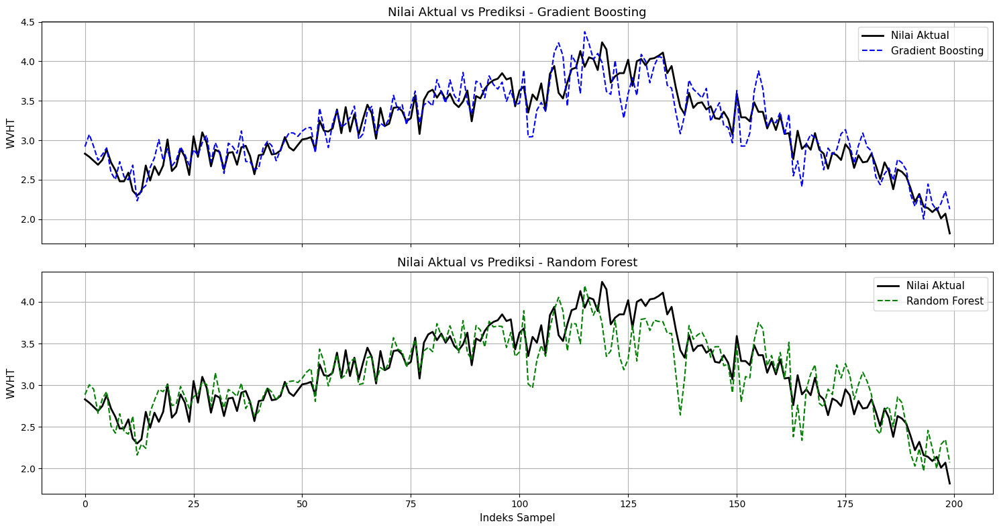

In [ ]:
# Pastikan data berupa array
actual = np.array(y_test)
pred_rf = np.array(y_pred_rf)
pred_gb = np.array(y_pred_gb)

# Jumlah sampel yang ingin ditampilkan
n_points = 200
indices = np.arange(len(actual))[:n_points]

# Buat figure dengan 2 subplot vertikal (2 baris, 1 kolom)
fig, axes = plt.subplots(2, 1, figsize=(15, 8), sharex=True)

# --- Plot Gradient Boosting (atas) ---
axes[0].plot(indices, actual[:n_points], label='Nilai Aktual', color='black', linewidth=2)
axes[0].plot(indices, pred_gb[:n_points], label='Gradient Boosting', linestyle='--', color='blue')
axes[0].set_title('Nilai Aktual vs Prediksi - Gradient Boosting', fontsize=13)
axes[0].set_ylabel('WVHT', fontsize=11)
axes[0].legend(fontsize=11)
axes[0].grid(True)


# --- Plot Random Forest (bawah) ---
axes[1].plot(indices, actual[:n_points], label='Nilai Aktual', color='black', linewidth=2)
axes[1].plot(indices, pred_rf[:n_points], label='Random Forest', linestyle='--', color='green')
axes[1].set_title('Nilai Aktual vs Prediksi - Random Forest', fontsize=13)
axes[1].set_xlabel('Indeks Sampel', fontsize=11)
axes[1].set_ylabel('WVHT', fontsize=11)
axes[1].legend(fontsize=11)
axes[1].grid(True)

# Tata letak agar rapi
plt.tight_layout()
plt.show()

# Feature Importance

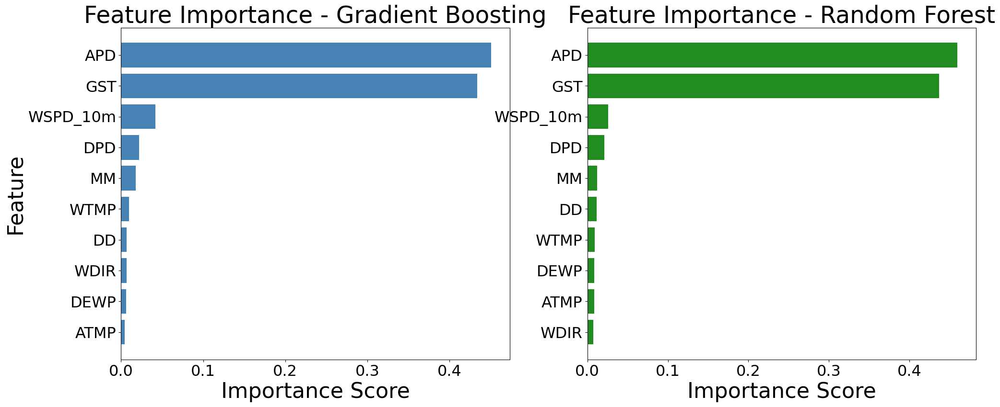

In [160]:
# --- Gradient Boosting ---
importance_gb = gb_best.feature_importances_
features = X_train.columns
df_importance_gb = pd.DataFrame({'Feature': features, 'Importance': importance_gb})
df_importance_gb = df_importance_gb.sort_values(by='Importance', ascending=True)

# --- Random Forest ---
importance_rf = rf_best.feature_importances_
df_importance_rf = pd.DataFrame({'Feature': features, 'Importance': importance_rf})
df_importance_rf = df_importance_rf.sort_values(by='Importance', ascending=True)

# --- Plot gabungan (tanpa sharey agar ylabel berbeda) ---
fig, axes = plt.subplots(1, 2, figsize=(23, 9), sharey=False)

# Plot Gradient Boosting
axes[0].barh(df_importance_gb['Feature'], df_importance_gb['Importance'], color='steelblue')
axes[0].set_title('Feature Importance - Gradient Boosting', fontsize=35)
axes[0].set_xlabel('Importance Score', fontsize=32)
axes[0].set_ylabel('Feature', fontsize=32)
axes[0].tick_params(axis='x', labelsize=23)
axes[0].tick_params(axis='y', labelsize=23)

# Plot Random Forest
axes[1].barh(df_importance_rf['Feature'], df_importance_rf['Importance'], color='forestgreen')
axes[1].set_title('Feature Importance - Random Forest', fontsize=35)
axes[1].set_xlabel('Importance Score', fontsize=32)
axes[1].tick_params(axis='x', labelsize=23)
axes[1].tick_params(axis='y', labelsize=23)


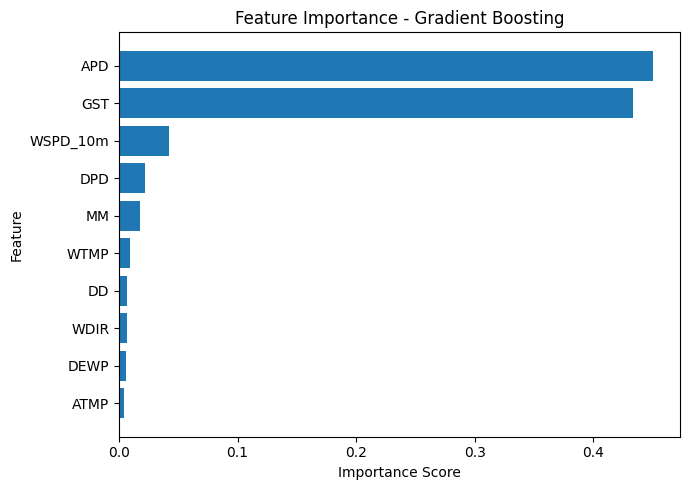

,Feature,Importances
0,APD,0.450777
1,GST,0.433560
2,WSPD_10m,0.042000
3,DPD,0.021938
4,MM,0.018034
5,WTMP,0.009665
6,DD,0.006706
7,WDIR,0.006560
8,DEWP,0.006282
9,ATMP,0.004477


In [122]:
# Gradient Boosting

# Interpretasi fitur penting
importance = gb_best.feature_importances_
features = X_train.columns

# Definisikan dataframe untuk interpretasi fitur penting
df_importance = pd.DataFrame({'Feature': features,
                              'Importances': importance})
# Urutkan dari yang terkuat
df_importance = (df_importance
                  .sort_values('Importances', ascending=False)
                  .reset_index(drop=True))

# Visualisasi feature importance
plt.figure(figsize=(7,5))
plt.barh(
    df_importance['Feature'][::-1],      # balik agar fitur terpenting di atas 
    df_importance['Importances'][::-1])
plt.title('Feature Importance - Gradient Boosting')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

# Tampilkan dataframe feature importance
df_importance

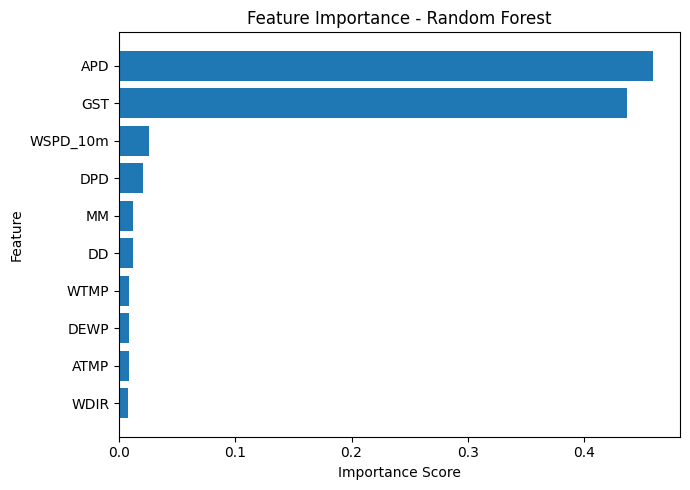

,Feature,Importances
0,APD,0.459571
1,GST,0.436831
2,WSPD_10m,0.025665
3,DPD,0.020780
4,MM,0.011910
5,DD,0.011748
6,WTMP,0.008913
7,DEWP,0.008775
8,ATMP,0.008263
9,WDIR,0.007544


In [123]:
# Random Forest

# Interpretasi fitur penting
importance = rf_best.feature_importances_
features = X_train.columns

# Definisikan dataframe untuk interpretasi fitur penting
df_importance = pd.DataFrame({'Feature': features,
                              'Importances': importance})
# Urutkan dari yang terkuat
df_importance = (df_importance
                  .sort_values('Importances', ascending=False)
                  .reset_index(drop=True))

# Visualisasi feature importance
plt.figure(figsize=(7,5))
plt.barh(
    df_importance['Feature'][::-1],      # balik agar fitur terpenting di atas 
    df_importance['Importances'][::-1])
plt.title('Feature Importance - Random Forest')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

# Tampilkan dataframe feature importance
df_importance